# **Homework 6 - Generative Adversarial Network**

This is the example code of homework 6 of the machine learning course by Prof. Hung-yi Lee.


## Random seed
Set the random seed to a certain value for reproducibility.

In [1]:
import random

import torch
import numpy as np


def same_seeds(seed):
    # Python built-in random module
    random.seed(seed)
    # Numpy
    np.random.seed(seed)
    # Torch
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.benchmark = False
    torch.backends.cudnn.deterministic = True

same_seeds(2021)

## Import Packages
First, we need to import packages that will be used later.

And we highly rely on **torchvision**, a library of PyTorch.

In [2]:
import os
import glob

import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import torchvision.models as models
from torch import optim
from torch.autograd import Variable
from torch.utils.data import Dataset, DataLoader


from scipy import linalg
from torch.nn.functional import adaptive_avg_pool2d
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm

C:\Users\BiXY\anaconda3\envs\mmcv\lib\site-packages\scipy\__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


## Dataset
1. Resize the images to (64, 64)
1. Linearly map the values from [0, 1] to  [-1, 1].

Refer to [PyTorch official website](https://pytorch.org/vision/stable/transforms.html) for details about different transforms.


In [3]:
class CrypkoDataset(Dataset):
    def __init__(self, fnames, transform):
        self.transform = transform
        self.fnames = fnames
        self.num_samples = len(self.fnames)

    def __getitem__(self,idx):
        fname = self.fnames[idx]
        # 1. Load the image
        img = torchvision.io.read_image(fname)
        # 2. Resize and normalize the images using torchvision.
        img = self.transform(img)
        return img

    def __len__(self):
        return self.num_samples


def get_dataset(root):
    fnames = glob.glob(os.path.join(root, '*'))
    # 1. Resize the image to (64, 64)
    # 2. Linearly map [0, 1] to [-1, 1]
    compose = [
        transforms.ToPILImage(),
        transforms.Resize((64, 64)),
        transforms.ToTensor(),
        transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5)),
    ]
    transform = transforms.Compose(compose)
    dataset = CrypkoDataset(fnames, transform)
    return dataset

### Show some images
The values are in the range of [-1, 1], we should shift them to the valid range, [0, 1], to display correctly.

In [4]:
path = 'C:/Users/BiXY/OneDrive - 厦门大学(马来西亚分校)/科研（RA）/火炉实验室/pytorch/data'
print(os.path.join(path, 'faces'))

C:/Users/BiXY/OneDrive - 厦门大学(马来西亚分校)/科研（RA）/火炉实验室/pytorch/data\faces


In [5]:
dataset = get_dataset(os.path.join(path, 'faces'))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


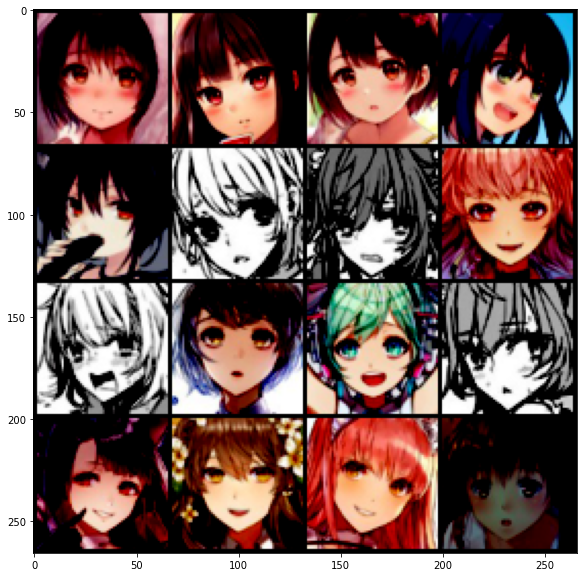

In [6]:
images = [dataset[i] for i in range(16)]
grid_img = torchvision.utils.make_grid(images, nrow=4)
plt.figure(figsize=(10,10))
plt.imshow(grid_img.permute(1, 2, 0))
plt.show()

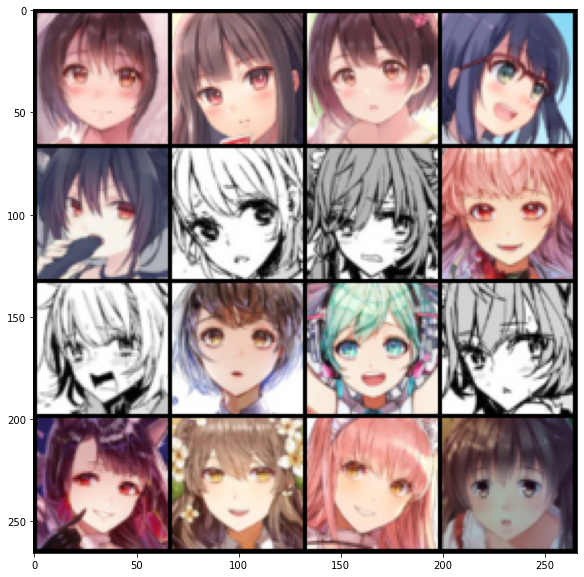

In [7]:
images = [(dataset[i]+1)/2 for i in range(16)]
grid_img = torchvision.utils.make_grid(images, nrow=4)
plt.figure(figsize=(10,10))
plt.imshow(grid_img.permute(1, 2, 0))
plt.show()

## Model
Here, we use DCGAN as the model structure. Feel free to modify your own model structure.

Note that the `N` of the input/output shape stands for the batch size.

In [8]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)

class Generator(nn.Module):
    """
    Input shape: (N, in_dim)
    Output shape: (N, 3, 64, 64)
    """
    def __init__(self, in_dim, dim=64):
        super(Generator, self).__init__()
        def dconv_bn_relu(in_dim, out_dim):
            return nn.Sequential(
                nn.ConvTranspose2d(in_dim, out_dim, 5, 2,
                                   padding=2, output_padding=1, bias=False),
                nn.BatchNorm2d(out_dim),
                nn.ReLU()
            )
        self.l1 = nn.Sequential(
            nn.Linear(in_dim, dim * 8 * 4 * 4, bias=False),
            nn.BatchNorm1d(dim * 8 * 4 * 4),
            nn.ReLU()
        )
        self.l2_5 = nn.Sequential(
            dconv_bn_relu(dim * 8, dim * 4),
            dconv_bn_relu(dim * 4, dim * 2),
            dconv_bn_relu(dim * 2, dim),
            nn.ConvTranspose2d(dim, 3, 5, 2, padding=2, output_padding=1),
            nn.Tanh()
        )
        self.apply(weights_init)

    def forward(self, x):
        y = self.l1(x)
        y = y.view(y.size(0), -1, 4, 4)
        y = self.l2_5(y)
        return y


class Discriminator(nn.Module):
    """
    Input shape: (N, 3, 64, 64)
    Output shape: (N, )
    """
    def __init__(self, in_dim, dim=64):
        super(Discriminator, self).__init__()

        def conv_bn_lrelu(in_dim, out_dim):
            return nn.Sequential(
                nn.Conv2d(in_dim, out_dim, 5, 2, 2),
                nn.BatchNorm2d(out_dim),
                nn.LeakyReLU(0.2),
            )
            
        """ Medium: Remove the last sigmoid layer for WGAN. """
        self.ls = nn.Sequential(
            nn.Conv2d(in_dim, dim, 5, 2, 2), 
            nn.LeakyReLU(0.2),
            conv_bn_lrelu(dim, dim * 2),
            conv_bn_lrelu(dim * 2, dim * 4),
            conv_bn_lrelu(dim * 4, dim * 8),
            nn.Conv2d(dim * 8, 1, 4),
            nn.Sigmoid(), 
        )
        self.apply(weights_init)
        
    def forward(self, x):
        y = self.ls(x)
        y = y.view(-1)
        return y

In [9]:
class InceptionV3(nn.Module):
    """Pretrained InceptionV3 network returning feature maps"""

    # Index of default block of inception to return,
    # corresponds to output of final average pooling
    DEFAULT_BLOCK_INDEX = 3

    # Maps feature dimensionality to their output blocks indices
    BLOCK_INDEX_BY_DIM = {
        64: 0,   # First max pooling features
        192: 1,  # Second max pooling featurs
        768: 2,  # Pre-aux classifier features
        2048: 3  # Final average pooling features
    }

    def __init__(self,
                 output_blocks=[DEFAULT_BLOCK_INDEX],
                 resize_input=True,
                 normalize_input=True,
                 requires_grad=False):
        
        super(InceptionV3, self).__init__()

        self.resize_input = resize_input
        self.normalize_input = normalize_input
        self.output_blocks = sorted(output_blocks)
        self.last_needed_block = max(output_blocks)

        assert self.last_needed_block <= 3, \
            'Last possible output block index is 3'

        self.blocks = nn.ModuleList()

        
        inception = models.inception_v3(pretrained=True)

        # Block 0: input to maxpool1
        block0 = [
            inception.Conv2d_1a_3x3,
            inception.Conv2d_2a_3x3,
            inception.Conv2d_2b_3x3,
            nn.MaxPool2d(kernel_size=3, stride=2)
        ]
        self.blocks.append(nn.Sequential(*block0))

        # Block 1: maxpool1 to maxpool2
        if self.last_needed_block >= 1:
            block1 = [
                inception.Conv2d_3b_1x1,
                inception.Conv2d_4a_3x3,
                nn.MaxPool2d(kernel_size=3, stride=2)
            ]
            self.blocks.append(nn.Sequential(*block1))

        # Block 2: maxpool2 to aux classifier
        if self.last_needed_block >= 2:
            block2 = [
                inception.Mixed_5b,
                inception.Mixed_5c,
                inception.Mixed_5d,
                inception.Mixed_6a,
                inception.Mixed_6b,
                inception.Mixed_6c,
                inception.Mixed_6d,
                inception.Mixed_6e,
            ]
            self.blocks.append(nn.Sequential(*block2))

        # Block 3: aux classifier to final avgpool
        if self.last_needed_block >= 3:
            block3 = [
                inception.Mixed_7a,
                inception.Mixed_7b,
                inception.Mixed_7c,
                nn.AdaptiveAvgPool2d(output_size=(1, 1))
            ]
            self.blocks.append(nn.Sequential(*block3))

        for param in self.parameters():
            param.requires_grad = requires_grad

    def forward(self, inp):
        """Get Inception feature maps
        Parameters
        ----------
        inp : torch.autograd.Variable
            Input tensor of shape Bx3xHxW. Values are expected to be in
            range (0, 1)
        Returns
        -------
        List of torch.autograd.Variable, corresponding to the selected output
        block, sorted ascending by index
        """
        outp = []
        x = inp

        if self.resize_input:
            x = F.interpolate(x,
                              size=(299, 299),
                              mode='bilinear',
                              align_corners=False)

        if self.normalize_input:
            x = 2 * x - 1  # Scale from range (0, 1) to range (-1, 1)

        for idx, block in enumerate(self.blocks):
            x = block(x)
            if idx in self.output_blocks:
                outp.append(x)

            if idx == self.last_needed_block:
                break

        return outp
    
block_idx = InceptionV3.BLOCK_INDEX_BY_DIM[2048]
model = InceptionV3([block_idx])
model=model.cuda()

## Training

### Initialization
- hyperparameters
- model
- optimizer
- dataloader

In [10]:
# Training hyperparameters
batch_size = 64
z_dim = 100
z_sample = Variable(torch.randn(100, z_dim)).cuda()
lr = 1e-4

""" Medium: WGAN, 50 epoch, n_critic=5, clip_value=0.01 """
n_epoch = 10 # 50
n_critic = 1 # 5
# clip_value = 0.01

log_dir = os.path.join(path, 'logs')
ckpt_dir = os.path.join(path, 'checkpoints')
os.makedirs(log_dir, exist_ok=True)
os.makedirs(ckpt_dir, exist_ok=True)

# Model
G = Generator(in_dim=z_dim).cuda()
D = Discriminator(3).cuda()
G.train()
D.train()

# Loss
criterion = nn.BCELoss()

""" Medium: Use RMSprop for WGAN. """
# Optimizer
opt_D = torch.optim.Adam(D.parameters(), lr=lr, betas=(0.5, 0.999))
opt_G = torch.optim.Adam(G.parameters(), lr=lr, betas=(0.5, 0.999))
# opt_D = torch.optim.RMSprop(D.parameters(), lr=lr)
# opt_G = torch.optim.RMSprop(G.parameters(), lr=lr)


# DataLoader
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=0)


### Training loop
We store some pictures regularly to monitor the current performance of the Generator, and regularly record checkpoints.

In [11]:
class InceptionV3(nn.Module):
    """Pretrained InceptionV3 network returning feature maps"""

    # Index of default block of inception to return,
    # corresponds to output of final average pooling
    DEFAULT_BLOCK_INDEX = 3

    # Maps feature dimensionality to their output blocks indices
    BLOCK_INDEX_BY_DIM = {
        64: 0,   # First max pooling features
        192: 1,  # Second max pooling featurs
        768: 2,  # Pre-aux classifier features
        2048: 3  # Final average pooling features
    }

    def __init__(self,
                 output_blocks=[DEFAULT_BLOCK_INDEX],
                 resize_input=True,
                 normalize_input=True,
                 requires_grad=False):
        
        super(InceptionV3, self).__init__()

        self.resize_input = resize_input
        self.normalize_input = normalize_input
        self.output_blocks = sorted(output_blocks)
        self.last_needed_block = max(output_blocks)

        assert self.last_needed_block <= 3, \
            'Last possible output block index is 3'

        self.blocks = nn.ModuleList()

        
        inception = models.inception_v3(pretrained=True)

        # Block 0: input to maxpool1
        block0 = [
            inception.Conv2d_1a_3x3,
            inception.Conv2d_2a_3x3,
            inception.Conv2d_2b_3x3,
            nn.MaxPool2d(kernel_size=3, stride=2)
        ]
        self.blocks.append(nn.Sequential(*block0))

        # Block 1: maxpool1 to maxpool2
        if self.last_needed_block >= 1:
            block1 = [
                inception.Conv2d_3b_1x1,
                inception.Conv2d_4a_3x3,
                nn.MaxPool2d(kernel_size=3, stride=2)
            ]
            self.blocks.append(nn.Sequential(*block1))

        # Block 2: maxpool2 to aux classifier
        if self.last_needed_block >= 2:
            block2 = [
                inception.Mixed_5b,
                inception.Mixed_5c,
                inception.Mixed_5d,
                inception.Mixed_6a,
                inception.Mixed_6b,
                inception.Mixed_6c,
                inception.Mixed_6d,
                inception.Mixed_6e,
            ]
            self.blocks.append(nn.Sequential(*block2))

        # Block 3: aux classifier to final avgpool
        if self.last_needed_block >= 3:
            block3 = [
                inception.Mixed_7a,
                inception.Mixed_7b,
                inception.Mixed_7c,
                nn.AdaptiveAvgPool2d(output_size=(1, 1))
            ]
            self.blocks.append(nn.Sequential(*block3))

        for param in self.parameters():
            param.requires_grad = requires_grad

    def forward(self, inp):
        """Get Inception feature maps
        Parameters
        ----------
        inp : torch.autograd.Variable
            Input tensor of shape Bx3xHxW. Values are expected to be in
            range (0, 1)
        Returns
        -------
        List of torch.autograd.Variable, corresponding to the selected output
        block, sorted ascending by index
        """
        outp = []
        x = inp

        if self.resize_input:
            x = F.interpolate(x,
                              size=(299, 299),
                              mode='bilinear',
                              align_corners=False)

        if self.normalize_input:
            x = 2 * x - 1  # Scale from range (0, 1) to range (-1, 1)

        for idx, block in enumerate(self.blocks):
            x = block(x)
            if idx in self.output_blocks:
                outp.append(x)

            if idx == self.last_needed_block:
                break

        return outp
    
block_idx = InceptionV3.BLOCK_INDEX_BY_DIM[2048]
model = InceptionV3([block_idx])
model=model.cuda()

In [12]:
def calculate_activation_statistics(images,model,batch_size=128, dims=2048,
                    cuda=False):
    model.eval()
    act=np.empty((len(images), dims))
    
    if cuda:
        batch=images.cuda()
    else:
        batch=images
    pred = model(batch)[0]

        # If model output is not scalar, apply global spatial average pooling.
        # This happens if you choose a dimensionality not equal 2048.
    if pred.size(2) != 1 or pred.size(3) != 1:
        pred = adaptive_avg_pool2d(pred, output_size=(1, 1))

    act= pred.cpu().data.numpy().reshape(pred.size(0), -1)
    
    mu = np.mean(act, axis=0)
    sigma = np.cov(act, rowvar=False)
    return mu, sigma


In [13]:
def calculate_fretchet(images_real,images_fake,model):
    mu_1,std_1=calculate_activation_statistics(images_real,model,cuda=True)
    mu_2,std_2=calculate_activation_statistics(images_fake,model,cuda=True)
    
    """get fretched distance"""
    fid_value = calculate_frechet_distance(mu_1, std_1, mu_2, std_2)
    return fid_value

In [14]:
def calculate_frechet_distance(mu1, sigma1, mu2, sigma2, eps=1e-6):
    """Numpy implementation of the Frechet Distance.
    The Frechet distance between two multivariate Gaussians X_1 ~ N(mu_1, C_1)
    and X_2 ~ N(mu_2, C_2) is
            d^2 = ||mu_1 - mu_2||^2 + Tr(C_1 + C_2 - 2*sqrt(C_1*C_2)).
    """

    mu1 = np.atleast_1d(mu1)
    mu2 = np.atleast_1d(mu2)

    sigma1 = np.atleast_2d(sigma1)
    sigma2 = np.atleast_2d(sigma2)

    assert mu1.shape == mu2.shape, \
        'Training and test mean vectors have different lengths'
    assert sigma1.shape == sigma2.shape, \
        'Training and test covariances have different dimensions'

    diff = mu1 - mu2

    
    covmean, _ = linalg.sqrtm(sigma1.dot(sigma2), disp=False)
    if not np.isfinite(covmean).all():
        msg = ('fid calculation produces singular product; '
               'adding %s to diagonal of cov estimates') % eps
        print(msg)
        offset = np.eye(sigma1.shape[0]) * eps
        covmean = linalg.sqrtm((sigma1 + offset).dot(sigma2 + offset))

    
    if np.iscomplexobj(covmean):
        if not np.allclose(np.diagonal(covmean).imag, 0, atol=1e-3):
            m = np.max(np.abs(covmean.imag))
            raise ValueError('Imaginary component {}'.format(m))
        covmean = covmean.real

    tr_covmean = np.trace(covmean)

    return (diff.dot(diff) + np.trace(sigma1) +
            np.trace(sigma2) - 2 * tr_covmean)

  0%|          | 0/1115 [00:00<?, ?it/s]

{'Loss_D': 0.906, 'Loss_G': 2.5403, 'Epoch': 1, 'Step': 1}
{'Loss_D': 0.628, 'Loss_G': 4.7074, 'Epoch': 1, 'Step': 2}
{'Loss_D': 0.1384, 'Loss_G': 5.7235, 'Epoch': 1, 'Step': 3}
{'Loss_D': 0.0954, 'Loss_G': 5.4472, 'Epoch': 1, 'Step': 4}
{'Loss_D': 0.1122, 'Loss_G': 4.9278, 'Epoch': 1, 'Step': 5}
{'Loss_D': 0.1189, 'Loss_G': 5.5576, 'Epoch': 1, 'Step': 6}
{'Loss_D': 0.1003, 'Loss_G': 6.2959, 'Epoch': 1, 'Step': 7}
{'Loss_D': 0.0916, 'Loss_G': 6.4217, 'Epoch': 1, 'Step': 8}
{'Loss_D': 0.0739, 'Loss_G': 5.9531, 'Epoch': 1, 'Step': 9}
{'Loss_D': 0.1059, 'Loss_G': 6.751, 'Epoch': 1, 'Step': 10}
{'Loss_D': 0.0487, 'Loss_G': 6.3737, 'Epoch': 1, 'Step': 11}
{'Loss_D': 0.0941, 'Loss_G': 5.866, 'Epoch': 1, 'Step': 12}
{'Loss_D': 0.0592, 'Loss_G': 6.6347, 'Epoch': 1, 'Step': 13}
{'Loss_D': 0.0575, 'Loss_G': 6.9368, 'Epoch': 1, 'Step': 14}
{'Loss_D': 0.0428, 'Loss_G': 6.6432, 'Epoch': 1, 'Step': 15}
{'Loss_D': 0.043, 'Loss_G': 6.6793, 'Epoch': 1, 'Step': 16}
{'Loss_D': 0.0374, 'Loss_G': 6.8911, '

{'Loss_D': 0.1081, 'Loss_G': 10.7365, 'Epoch': 1, 'Step': 135}
{'Loss_D': 0.0652, 'Loss_G': 10.2672, 'Epoch': 1, 'Step': 136}
{'Loss_D': 0.0423, 'Loss_G': 7.8409, 'Epoch': 1, 'Step': 137}
{'Loss_D': 0.0543, 'Loss_G': 6.4231, 'Epoch': 1, 'Step': 138}
{'Loss_D': 0.1154, 'Loss_G': 10.561, 'Epoch': 1, 'Step': 139}
{'Loss_D': 0.0319, 'Loss_G': 9.9287, 'Epoch': 1, 'Step': 140}
{'Loss_D': 0.0416, 'Loss_G': 6.93, 'Epoch': 1, 'Step': 141}
{'Loss_D': 0.1539, 'Loss_G': 8.4012, 'Epoch': 1, 'Step': 142}
{'Loss_D': 0.0395, 'Loss_G': 8.326, 'Epoch': 1, 'Step': 143}
{'Loss_D': 0.0595, 'Loss_G': 7.6522, 'Epoch': 1, 'Step': 144}
{'Loss_D': 0.1462, 'Loss_G': 11.3541, 'Epoch': 1, 'Step': 145}
{'Loss_D': 0.1493, 'Loss_G': 8.663, 'Epoch': 1, 'Step': 146}
{'Loss_D': 0.2917, 'Loss_G': 21.3697, 'Epoch': 1, 'Step': 147}
{'Loss_D': 0.7047, 'Loss_G': 14.167, 'Epoch': 1, 'Step': 148}
{'Loss_D': 0.0173, 'Loss_G': 5.1113, 'Epoch': 1, 'Step': 149}
{'Loss_D': 1.0371, 'Loss_G': 28.5995, 'Epoch': 1, 'Step': 150}
{'Loss_

{'Loss_D': 0.6159, 'Loss_G': 8.1169, 'Epoch': 1, 'Step': 268}
{'Loss_D': 0.1373, 'Loss_G': 4.2864, 'Epoch': 1, 'Step': 269}
{'Loss_D': 0.5187, 'Loss_G': 15.9086, 'Epoch': 1, 'Step': 270}
{'Loss_D': 0.3958, 'Loss_G': 15.954, 'Epoch': 1, 'Step': 271}
{'Loss_D': 0.1393, 'Loss_G': 11.8628, 'Epoch': 1, 'Step': 272}
{'Loss_D': 0.1045, 'Loss_G': 6.0065, 'Epoch': 1, 'Step': 273}
{'Loss_D': 0.0759, 'Loss_G': 5.3137, 'Epoch': 1, 'Step': 274}
{'Loss_D': 0.0717, 'Loss_G': 7.2366, 'Epoch': 1, 'Step': 275}
{'Loss_D': 0.0921, 'Loss_G': 6.5449, 'Epoch': 1, 'Step': 276}
{'Loss_D': 0.1939, 'Loss_G': 5.398, 'Epoch': 1, 'Step': 277}
{'Loss_D': 0.0785, 'Loss_G': 6.264, 'Epoch': 1, 'Step': 278}
{'Loss_D': 0.0594, 'Loss_G': 6.0895, 'Epoch': 1, 'Step': 279}
{'Loss_D': 0.1043, 'Loss_G': 7.6203, 'Epoch': 1, 'Step': 280}
{'Loss_D': 0.0956, 'Loss_G': 6.7695, 'Epoch': 1, 'Step': 281}
{'Loss_D': 0.1011, 'Loss_G': 5.407, 'Epoch': 1, 'Step': 282}
{'Loss_D': 0.1268, 'Loss_G': 6.2261, 'Epoch': 1, 'Step': 283}
{'Loss_D'

{'Loss_D': 0.0785, 'Loss_G': 4.8418, 'Epoch': 1, 'Step': 401}
{'Loss_D': 0.066, 'Loss_G': 5.2868, 'Epoch': 1, 'Step': 402}
{'Loss_D': 0.0189, 'Loss_G': 5.5064, 'Epoch': 1, 'Step': 403}
{'Loss_D': 0.0224, 'Loss_G': 5.4101, 'Epoch': 1, 'Step': 404}
{'Loss_D': 0.0355, 'Loss_G': 5.6361, 'Epoch': 1, 'Step': 405}
{'Loss_D': 0.0458, 'Loss_G': 5.3696, 'Epoch': 1, 'Step': 406}
{'Loss_D': 0.1164, 'Loss_G': 5.3531, 'Epoch': 1, 'Step': 407}
{'Loss_D': 0.1675, 'Loss_G': 9.2394, 'Epoch': 1, 'Step': 408}
{'Loss_D': 0.082, 'Loss_G': 7.5538, 'Epoch': 1, 'Step': 409}
{'Loss_D': 0.1518, 'Loss_G': 6.6619, 'Epoch': 1, 'Step': 410}
{'Loss_D': 0.1371, 'Loss_G': 7.5983, 'Epoch': 1, 'Step': 411}
{'Loss_D': 0.0955, 'Loss_G': 6.5533, 'Epoch': 1, 'Step': 412}
{'Loss_D': 0.049, 'Loss_G': 4.693, 'Epoch': 1, 'Step': 413}
{'Loss_D': 0.0666, 'Loss_G': 5.6001, 'Epoch': 1, 'Step': 414}
{'Loss_D': 0.0907, 'Loss_G': 6.1473, 'Epoch': 1, 'Step': 415}
{'Loss_D': 0.1145, 'Loss_G': 4.9069, 'Epoch': 1, 'Step': 416}
{'Loss_D': 0

{'Loss_D': 0.1333, 'Loss_G': 5.5345, 'Epoch': 1, 'Step': 534}
{'Loss_D': 0.2243, 'Loss_G': 3.9421, 'Epoch': 1, 'Step': 535}
{'Loss_D': 0.3134, 'Loss_G': 6.4497, 'Epoch': 1, 'Step': 536}
{'Loss_D': 0.2222, 'Loss_G': 5.7586, 'Epoch': 1, 'Step': 537}
{'Loss_D': 0.2912, 'Loss_G': 4.1869, 'Epoch': 1, 'Step': 538}
{'Loss_D': 0.3652, 'Loss_G': 7.2531, 'Epoch': 1, 'Step': 539}
{'Loss_D': 0.6802, 'Loss_G': 2.5962, 'Epoch': 1, 'Step': 540}
{'Loss_D': 0.4706, 'Loss_G': 5.2311, 'Epoch': 1, 'Step': 541}
{'Loss_D': 0.092, 'Loss_G': 5.1349, 'Epoch': 1, 'Step': 542}
{'Loss_D': 0.131, 'Loss_G': 4.254, 'Epoch': 1, 'Step': 543}
{'Loss_D': 0.1374, 'Loss_G': 3.7659, 'Epoch': 1, 'Step': 544}
{'Loss_D': 0.2433, 'Loss_G': 4.6031, 'Epoch': 1, 'Step': 545}
{'Loss_D': 0.2498, 'Loss_G': 3.7454, 'Epoch': 1, 'Step': 546}
{'Loss_D': 0.2224, 'Loss_G': 4.6435, 'Epoch': 1, 'Step': 547}
{'Loss_D': 0.1657, 'Loss_G': 4.861, 'Epoch': 1, 'Step': 548}
{'Loss_D': 0.124, 'Loss_G': 3.5153, 'Epoch': 1, 'Step': 549}
{'Loss_D': 0.

{'Loss_D': 0.1422, 'Loss_G': 5.3183, 'Epoch': 1, 'Step': 667}
{'Loss_D': 0.1615, 'Loss_G': 4.8298, 'Epoch': 1, 'Step': 668}
{'Loss_D': 0.2929, 'Loss_G': 5.8883, 'Epoch': 1, 'Step': 669}
{'Loss_D': 0.1237, 'Loss_G': 6.1361, 'Epoch': 1, 'Step': 670}
{'Loss_D': 0.2036, 'Loss_G': 4.6344, 'Epoch': 1, 'Step': 671}
{'Loss_D': 0.1622, 'Loss_G': 7.104, 'Epoch': 1, 'Step': 672}
{'Loss_D': 0.1181, 'Loss_G': 5.5444, 'Epoch': 1, 'Step': 673}
{'Loss_D': 0.2085, 'Loss_G': 3.4309, 'Epoch': 1, 'Step': 674}
{'Loss_D': 0.3776, 'Loss_G': 8.1905, 'Epoch': 1, 'Step': 675}
{'Loss_D': 0.3444, 'Loss_G': 7.0152, 'Epoch': 1, 'Step': 676}
{'Loss_D': 0.1364, 'Loss_G': 4.0776, 'Epoch': 1, 'Step': 677}
{'Loss_D': 0.3027, 'Loss_G': 7.3527, 'Epoch': 1, 'Step': 678}
{'Loss_D': 0.246, 'Loss_G': 4.6112, 'Epoch': 1, 'Step': 679}
{'Loss_D': 0.1164, 'Loss_G': 4.1163, 'Epoch': 1, 'Step': 680}
{'Loss_D': 0.1864, 'Loss_G': 6.3732, 'Epoch': 1, 'Step': 681}
{'Loss_D': 0.1088, 'Loss_G': 5.5605, 'Epoch': 1, 'Step': 682}
{'Loss_D':

{'Loss_D': 0.2645, 'Loss_G': 4.6225, 'Epoch': 1, 'Step': 800}
{'Loss_D': 0.3073, 'Loss_G': 6.4771, 'Epoch': 1, 'Step': 801}
{'Loss_D': 0.3739, 'Loss_G': 3.4618, 'Epoch': 1, 'Step': 802}
{'Loss_D': 0.2793, 'Loss_G': 8.2705, 'Epoch': 1, 'Step': 803}
{'Loss_D': 0.0964, 'Loss_G': 7.3226, 'Epoch': 1, 'Step': 804}
{'Loss_D': 0.1555, 'Loss_G': 4.0304, 'Epoch': 1, 'Step': 805}
{'Loss_D': 0.1978, 'Loss_G': 6.3136, 'Epoch': 1, 'Step': 806}
{'Loss_D': 0.0896, 'Loss_G': 5.894, 'Epoch': 1, 'Step': 807}
{'Loss_D': 0.0829, 'Loss_G': 4.5798, 'Epoch': 1, 'Step': 808}
{'Loss_D': 0.1321, 'Loss_G': 5.297, 'Epoch': 1, 'Step': 809}
{'Loss_D': 0.1591, 'Loss_G': 4.1719, 'Epoch': 1, 'Step': 810}
{'Loss_D': 0.1703, 'Loss_G': 4.8637, 'Epoch': 1, 'Step': 811}
{'Loss_D': 0.1113, 'Loss_G': 4.9646, 'Epoch': 1, 'Step': 812}
{'Loss_D': 0.0952, 'Loss_G': 5.5456, 'Epoch': 1, 'Step': 813}
{'Loss_D': 0.1382, 'Loss_G': 5.1657, 'Epoch': 1, 'Step': 814}
{'Loss_D': 0.1515, 'Loss_G': 4.5762, 'Epoch': 1, 'Step': 815}
{'Loss_D':

{'Loss_D': 0.1618, 'Loss_G': 4.6286, 'Epoch': 1, 'Step': 933}
{'Loss_D': 0.2506, 'Loss_G': 6.8507, 'Epoch': 1, 'Step': 934}
{'Loss_D': 0.144, 'Loss_G': 5.5006, 'Epoch': 1, 'Step': 935}
{'Loss_D': 0.1365, 'Loss_G': 7.1463, 'Epoch': 1, 'Step': 936}
{'Loss_D': 0.0742, 'Loss_G': 6.0029, 'Epoch': 1, 'Step': 937}
{'Loss_D': 0.1885, 'Loss_G': 5.7086, 'Epoch': 1, 'Step': 938}
{'Loss_D': 0.204, 'Loss_G': 10.3403, 'Epoch': 1, 'Step': 939}
{'Loss_D': 0.4804, 'Loss_G': 4.5924, 'Epoch': 1, 'Step': 940}
{'Loss_D': 0.3936, 'Loss_G': 12.7888, 'Epoch': 1, 'Step': 941}
{'Loss_D': 0.137, 'Loss_G': 12.2816, 'Epoch': 1, 'Step': 942}
{'Loss_D': 0.3482, 'Loss_G': 4.7512, 'Epoch': 1, 'Step': 943}
{'Loss_D': 0.28, 'Loss_G': 7.5834, 'Epoch': 1, 'Step': 944}
{'Loss_D': 0.1023, 'Loss_G': 6.6134, 'Epoch': 1, 'Step': 945}
{'Loss_D': 0.1359, 'Loss_G': 5.5491, 'Epoch': 1, 'Step': 946}
{'Loss_D': 0.3163, 'Loss_G': 9.0621, 'Epoch': 1, 'Step': 947}
{'Loss_D': 0.4125, 'Loss_G': 4.2853, 'Epoch': 1, 'Step': 948}
{'Loss_D':

{'Loss_D': 0.3322, 'Loss_G': 7.0411, 'Epoch': 1, 'Step': 1065}
{'Loss_D': 0.4024, 'Loss_G': 3.2543, 'Epoch': 1, 'Step': 1066}
{'Loss_D': 0.5537, 'Loss_G': 10.6569, 'Epoch': 1, 'Step': 1067}
{'Loss_D': 0.3749, 'Loss_G': 8.1598, 'Epoch': 1, 'Step': 1068}
{'Loss_D': 0.1237, 'Loss_G': 4.3792, 'Epoch': 1, 'Step': 1069}
{'Loss_D': 0.4058, 'Loss_G': 11.0478, 'Epoch': 1, 'Step': 1070}
{'Loss_D': 0.7165, 'Loss_G': 4.5455, 'Epoch': 1, 'Step': 1071}
{'Loss_D': 0.3064, 'Loss_G': 5.719, 'Epoch': 1, 'Step': 1072}
{'Loss_D': 0.2242, 'Loss_G': 6.6808, 'Epoch': 1, 'Step': 1073}
{'Loss_D': 0.0963, 'Loss_G': 5.6921, 'Epoch': 1, 'Step': 1074}
{'Loss_D': 0.1185, 'Loss_G': 4.8393, 'Epoch': 1, 'Step': 1075}
{'Loss_D': 0.1873, 'Loss_G': 6.0572, 'Epoch': 1, 'Step': 1076}
{'Loss_D': 0.3062, 'Loss_G': 3.5693, 'Epoch': 1, 'Step': 1077}
{'Loss_D': 0.3515, 'Loss_G': 7.5465, 'Epoch': 1, 'Step': 1078}
{'Loss_D': 0.2085, 'Loss_G': 5.8783, 'Epoch': 1, 'Step': 1079}
{'Loss_D': 0.0973, 'Loss_G': 4.4167, 'Epoch': 1, 'Step

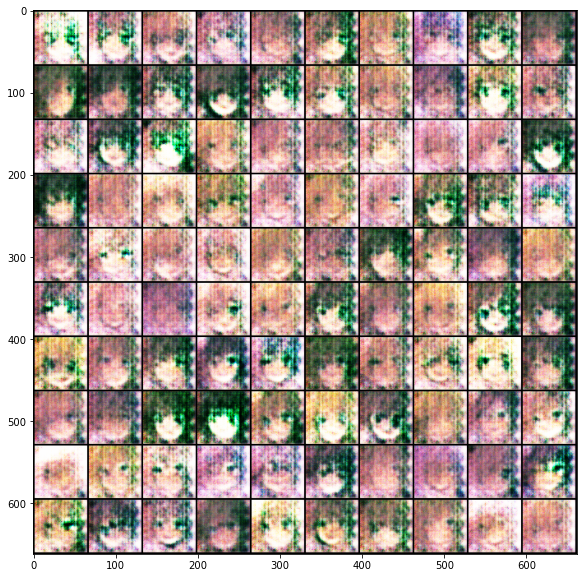

  0%|          | 0/1115 [00:00<?, ?it/s]

{'Loss_D': 0.9077, 'Loss_G': 9.2501, 'Epoch': 2, 'Step': 1116}
{'Loss_D': 0.2011, 'Loss_G': 10.127, 'Epoch': 2, 'Step': 1117}
{'Loss_D': 0.0939, 'Loss_G': 7.7481, 'Epoch': 2, 'Step': 1118}
{'Loss_D': 0.1386, 'Loss_G': 4.5209, 'Epoch': 2, 'Step': 1119}
{'Loss_D': 0.3973, 'Loss_G': 6.241, 'Epoch': 2, 'Step': 1120}
{'Loss_D': 0.3864, 'Loss_G': 3.4799, 'Epoch': 2, 'Step': 1121}
{'Loss_D': 0.3455, 'Loss_G': 6.5072, 'Epoch': 2, 'Step': 1122}
{'Loss_D': 0.1755, 'Loss_G': 5.7501, 'Epoch': 2, 'Step': 1123}
{'Loss_D': 0.1786, 'Loss_G': 3.4278, 'Epoch': 2, 'Step': 1124}
{'Loss_D': 0.2635, 'Loss_G': 6.5753, 'Epoch': 2, 'Step': 1125}
{'Loss_D': 0.207, 'Loss_G': 5.1819, 'Epoch': 2, 'Step': 1126}
{'Loss_D': 0.1052, 'Loss_G': 4.1724, 'Epoch': 2, 'Step': 1127}
{'Loss_D': 0.1613, 'Loss_G': 5.5584, 'Epoch': 2, 'Step': 1128}
{'Loss_D': 0.1479, 'Loss_G': 6.224, 'Epoch': 2, 'Step': 1129}
{'Loss_D': 0.1577, 'Loss_G': 4.6931, 'Epoch': 2, 'Step': 1130}
{'Loss_D': 0.1874, 'Loss_G': 4.2881, 'Epoch': 2, 'Step': 1

{'Loss_D': 0.2093, 'Loss_G': 7.1252, 'Epoch': 2, 'Step': 1248}
{'Loss_D': 0.1679, 'Loss_G': 5.5251, 'Epoch': 2, 'Step': 1249}
{'Loss_D': 0.1397, 'Loss_G': 4.4063, 'Epoch': 2, 'Step': 1250}
{'Loss_D': 0.1656, 'Loss_G': 4.7917, 'Epoch': 2, 'Step': 1251}
{'Loss_D': 0.1781, 'Loss_G': 5.3098, 'Epoch': 2, 'Step': 1252}
{'Loss_D': 0.0903, 'Loss_G': 4.9413, 'Epoch': 2, 'Step': 1253}
{'Loss_D': 0.1682, 'Loss_G': 4.2951, 'Epoch': 2, 'Step': 1254}
{'Loss_D': 0.3015, 'Loss_G': 6.053, 'Epoch': 2, 'Step': 1255}
{'Loss_D': 0.1401, 'Loss_G': 4.5983, 'Epoch': 2, 'Step': 1256}
{'Loss_D': 0.1419, 'Loss_G': 3.6369, 'Epoch': 2, 'Step': 1257}
{'Loss_D': 0.1946, 'Loss_G': 6.4639, 'Epoch': 2, 'Step': 1258}
{'Loss_D': 0.2575, 'Loss_G': 4.2877, 'Epoch': 2, 'Step': 1259}
{'Loss_D': 0.1618, 'Loss_G': 4.5212, 'Epoch': 2, 'Step': 1260}
{'Loss_D': 0.1422, 'Loss_G': 5.0554, 'Epoch': 2, 'Step': 1261}
{'Loss_D': 0.1559, 'Loss_G': 3.6992, 'Epoch': 2, 'Step': 1262}
{'Loss_D': 0.2578, 'Loss_G': 3.975, 'Epoch': 2, 'Step': 

{'Loss_D': 0.2155, 'Loss_G': 5.7169, 'Epoch': 2, 'Step': 1380}
{'Loss_D': 0.1765, 'Loss_G': 4.6239, 'Epoch': 2, 'Step': 1381}
{'Loss_D': 0.2325, 'Loss_G': 8.0666, 'Epoch': 2, 'Step': 1382}
{'Loss_D': 0.2209, 'Loss_G': 4.3914, 'Epoch': 2, 'Step': 1383}
{'Loss_D': 0.2145, 'Loss_G': 6.3507, 'Epoch': 2, 'Step': 1384}
{'Loss_D': 0.1102, 'Loss_G': 5.4166, 'Epoch': 2, 'Step': 1385}
{'Loss_D': 0.0798, 'Loss_G': 5.1165, 'Epoch': 2, 'Step': 1386}
{'Loss_D': 0.1058, 'Loss_G': 5.0718, 'Epoch': 2, 'Step': 1387}
{'Loss_D': 0.2966, 'Loss_G': 3.8219, 'Epoch': 2, 'Step': 1388}
{'Loss_D': 0.3022, 'Loss_G': 9.1749, 'Epoch': 2, 'Step': 1389}
{'Loss_D': 0.5285, 'Loss_G': 3.5652, 'Epoch': 2, 'Step': 1390}
{'Loss_D': 0.3678, 'Loss_G': 8.578, 'Epoch': 2, 'Step': 1391}
{'Loss_D': 0.2128, 'Loss_G': 6.5427, 'Epoch': 2, 'Step': 1392}
{'Loss_D': 0.0821, 'Loss_G': 4.9616, 'Epoch': 2, 'Step': 1393}
{'Loss_D': 0.1396, 'Loss_G': 5.3182, 'Epoch': 2, 'Step': 1394}
{'Loss_D': 0.2163, 'Loss_G': 5.734, 'Epoch': 2, 'Step': 

{'Loss_D': 0.4594, 'Loss_G': 8.5655, 'Epoch': 2, 'Step': 1512}
{'Loss_D': 0.5311, 'Loss_G': 5.2289, 'Epoch': 2, 'Step': 1513}
{'Loss_D': 0.082, 'Loss_G': 3.0417, 'Epoch': 2, 'Step': 1514}
{'Loss_D': 0.3626, 'Loss_G': 8.8432, 'Epoch': 2, 'Step': 1515}
{'Loss_D': 0.2022, 'Loss_G': 7.0058, 'Epoch': 2, 'Step': 1516}
{'Loss_D': 0.2252, 'Loss_G': 2.8949, 'Epoch': 2, 'Step': 1517}
{'Loss_D': 0.5, 'Loss_G': 8.4283, 'Epoch': 2, 'Step': 1518}
{'Loss_D': 0.2466, 'Loss_G': 6.9194, 'Epoch': 2, 'Step': 1519}
{'Loss_D': 0.1905, 'Loss_G': 2.6327, 'Epoch': 2, 'Step': 1520}
{'Loss_D': 0.3311, 'Loss_G': 6.7984, 'Epoch': 2, 'Step': 1521}
{'Loss_D': 0.1108, 'Loss_G': 6.2198, 'Epoch': 2, 'Step': 1522}
{'Loss_D': 0.0625, 'Loss_G': 5.3055, 'Epoch': 2, 'Step': 1523}
{'Loss_D': 0.2373, 'Loss_G': 3.3082, 'Epoch': 2, 'Step': 1524}
{'Loss_D': 0.3343, 'Loss_G': 8.862, 'Epoch': 2, 'Step': 1525}
{'Loss_D': 0.5425, 'Loss_G': 3.9559, 'Epoch': 2, 'Step': 1526}
{'Loss_D': 0.2839, 'Loss_G': 5.3804, 'Epoch': 2, 'Step': 152

{'Loss_D': 0.1691, 'Loss_G': 5.0879, 'Epoch': 2, 'Step': 1644}
{'Loss_D': 0.2174, 'Loss_G': 2.8759, 'Epoch': 2, 'Step': 1645}
{'Loss_D': 0.2738, 'Loss_G': 5.0188, 'Epoch': 2, 'Step': 1646}
{'Loss_D': 0.1585, 'Loss_G': 4.5035, 'Epoch': 2, 'Step': 1647}
{'Loss_D': 0.1593, 'Loss_G': 5.5952, 'Epoch': 2, 'Step': 1648}
{'Loss_D': 0.249, 'Loss_G': 2.054, 'Epoch': 2, 'Step': 1649}
{'Loss_D': 0.6346, 'Loss_G': 10.7016, 'Epoch': 2, 'Step': 1650}
{'Loss_D': 0.9757, 'Loss_G': 4.0072, 'Epoch': 2, 'Step': 1651}
{'Loss_D': 0.1828, 'Loss_G': 2.7261, 'Epoch': 2, 'Step': 1652}
{'Loss_D': 0.495, 'Loss_G': 8.3115, 'Epoch': 2, 'Step': 1653}
{'Loss_D': 0.3973, 'Loss_G': 4.8373, 'Epoch': 2, 'Step': 1654}
{'Loss_D': 0.1145, 'Loss_G': 3.7637, 'Epoch': 2, 'Step': 1655}
{'Loss_D': 0.426, 'Loss_G': 7.4063, 'Epoch': 2, 'Step': 1656}
{'Loss_D': 0.3788, 'Loss_G': 3.2554, 'Epoch': 2, 'Step': 1657}
{'Loss_D': 0.4802, 'Loss_G': 9.6926, 'Epoch': 2, 'Step': 1658}
{'Loss_D': 0.4623, 'Loss_G': 5.727, 'Epoch': 2, 'Step': 16

{'Loss_D': 0.6686, 'Loss_G': 9.2915, 'Epoch': 2, 'Step': 1776}
{'Loss_D': 0.6388, 'Loss_G': 6.1408, 'Epoch': 2, 'Step': 1777}
{'Loss_D': 0.1011, 'Loss_G': 2.5435, 'Epoch': 2, 'Step': 1778}
{'Loss_D': 0.3046, 'Loss_G': 5.4142, 'Epoch': 2, 'Step': 1779}
{'Loss_D': 0.0782, 'Loss_G': 6.6194, 'Epoch': 2, 'Step': 1780}
{'Loss_D': 0.1363, 'Loss_G': 4.5543, 'Epoch': 2, 'Step': 1781}
{'Loss_D': 0.2406, 'Loss_G': 4.4826, 'Epoch': 2, 'Step': 1782}
{'Loss_D': 0.3146, 'Loss_G': 7.4511, 'Epoch': 2, 'Step': 1783}
{'Loss_D': 0.3517, 'Loss_G': 4.1145, 'Epoch': 2, 'Step': 1784}
{'Loss_D': 0.2397, 'Loss_G': 2.7301, 'Epoch': 2, 'Step': 1785}
{'Loss_D': 0.4402, 'Loss_G': 9.4531, 'Epoch': 2, 'Step': 1786}
{'Loss_D': 0.4339, 'Loss_G': 7.0026, 'Epoch': 2, 'Step': 1787}
{'Loss_D': 0.0801, 'Loss_G': 4.1472, 'Epoch': 2, 'Step': 1788}
{'Loss_D': 0.1217, 'Loss_G': 4.3357, 'Epoch': 2, 'Step': 1789}
{'Loss_D': 0.1383, 'Loss_G': 5.9698, 'Epoch': 2, 'Step': 1790}
{'Loss_D': 0.1652, 'Loss_G': 4.0179, 'Epoch': 2, 'Step'

{'Loss_D': 0.1767, 'Loss_G': 4.2013, 'Epoch': 2, 'Step': 1908}
{'Loss_D': 0.1815, 'Loss_G': 3.5184, 'Epoch': 2, 'Step': 1909}
{'Loss_D': 0.1114, 'Loss_G': 3.6282, 'Epoch': 2, 'Step': 1910}
{'Loss_D': 0.1788, 'Loss_G': 4.3082, 'Epoch': 2, 'Step': 1911}
{'Loss_D': 0.1422, 'Loss_G': 3.8349, 'Epoch': 2, 'Step': 1912}
{'Loss_D': 0.2543, 'Loss_G': 4.3418, 'Epoch': 2, 'Step': 1913}
{'Loss_D': 0.2234, 'Loss_G': 4.2056, 'Epoch': 2, 'Step': 1914}
{'Loss_D': 0.2505, 'Loss_G': 4.8889, 'Epoch': 2, 'Step': 1915}
{'Loss_D': 0.1513, 'Loss_G': 4.7086, 'Epoch': 2, 'Step': 1916}
{'Loss_D': 0.1419, 'Loss_G': 3.7217, 'Epoch': 2, 'Step': 1917}
{'Loss_D': 0.1968, 'Loss_G': 4.3954, 'Epoch': 2, 'Step': 1918}
{'Loss_D': 0.1267, 'Loss_G': 4.2814, 'Epoch': 2, 'Step': 1919}
{'Loss_D': 0.1688, 'Loss_G': 2.7211, 'Epoch': 2, 'Step': 1920}
{'Loss_D': 0.199, 'Loss_G': 5.5113, 'Epoch': 2, 'Step': 1921}
{'Loss_D': 0.3383, 'Loss_G': 2.1269, 'Epoch': 2, 'Step': 1922}
{'Loss_D': 0.403, 'Loss_G': 7.7517, 'Epoch': 2, 'Step': 

{'Loss_D': 0.2496, 'Loss_G': 4.5251, 'Epoch': 2, 'Step': 2040}
{'Loss_D': 0.2342, 'Loss_G': 3.7937, 'Epoch': 2, 'Step': 2041}
{'Loss_D': 0.4569, 'Loss_G': 7.1247, 'Epoch': 2, 'Step': 2042}
{'Loss_D': 0.3828, 'Loss_G': 2.9116, 'Epoch': 2, 'Step': 2043}
{'Loss_D': 0.5832, 'Loss_G': 10.0162, 'Epoch': 2, 'Step': 2044}
{'Loss_D': 0.8371, 'Loss_G': 1.9073, 'Epoch': 2, 'Step': 2045}
{'Loss_D': 0.643, 'Loss_G': 8.5773, 'Epoch': 2, 'Step': 2046}
{'Loss_D': 0.3324, 'Loss_G': 6.2596, 'Epoch': 2, 'Step': 2047}
{'Loss_D': 0.1997, 'Loss_G': 3.6064, 'Epoch': 2, 'Step': 2048}
{'Loss_D': 0.4259, 'Loss_G': 6.5865, 'Epoch': 2, 'Step': 2049}
{'Loss_D': 0.2885, 'Loss_G': 4.5599, 'Epoch': 2, 'Step': 2050}
{'Loss_D': 0.2582, 'Loss_G': 4.7432, 'Epoch': 2, 'Step': 2051}
{'Loss_D': 0.1864, 'Loss_G': 4.6565, 'Epoch': 2, 'Step': 2052}
{'Loss_D': 0.2579, 'Loss_G': 3.7427, 'Epoch': 2, 'Step': 2053}
{'Loss_D': 0.2397, 'Loss_G': 6.3445, 'Epoch': 2, 'Step': 2054}
{'Loss_D': 0.227, 'Loss_G': 3.7751, 'Epoch': 2, 'Step':

{'Loss_D': 0.1955, 'Loss_G': 3.7122, 'Epoch': 2, 'Step': 2172}
{'Loss_D': 0.2872, 'Loss_G': 7.593, 'Epoch': 2, 'Step': 2173}
{'Loss_D': 0.1704, 'Loss_G': 5.8025, 'Epoch': 2, 'Step': 2174}
{'Loss_D': 0.1692, 'Loss_G': 2.1169, 'Epoch': 2, 'Step': 2175}
{'Loss_D': 0.3744, 'Loss_G': 8.3034, 'Epoch': 2, 'Step': 2176}
{'Loss_D': 0.257, 'Loss_G': 6.3163, 'Epoch': 2, 'Step': 2177}
{'Loss_D': 0.0953, 'Loss_G': 3.4892, 'Epoch': 2, 'Step': 2178}
{'Loss_D': 0.3501, 'Loss_G': 5.7908, 'Epoch': 2, 'Step': 2179}
{'Loss_D': 0.082, 'Loss_G': 5.4472, 'Epoch': 2, 'Step': 2180}
{'Loss_D': 0.3207, 'Loss_G': 2.4922, 'Epoch': 2, 'Step': 2181}
{'Loss_D': 0.5385, 'Loss_G': 6.8309, 'Epoch': 2, 'Step': 2182}
{'Loss_D': 0.4155, 'Loss_G': 3.6282, 'Epoch': 2, 'Step': 2183}
{'Loss_D': 0.1913, 'Loss_G': 3.9039, 'Epoch': 2, 'Step': 2184}
{'Loss_D': 0.1555, 'Loss_G': 5.4302, 'Epoch': 2, 'Step': 2185}
{'Loss_D': 0.1932, 'Loss_G': 3.5919, 'Epoch': 2, 'Step': 2186}
{'Loss_D': 0.2238, 'Loss_G': 5.0369, 'Epoch': 2, 'Step': 2

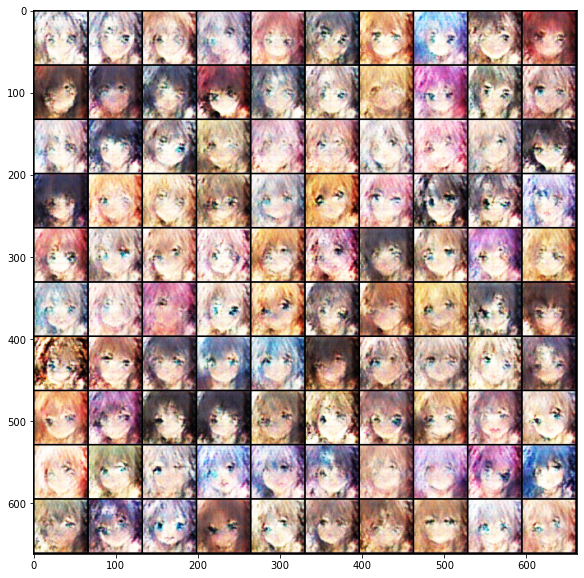

  0%|          | 0/1115 [00:00<?, ?it/s]

{'Loss_D': 0.3223, 'Loss_G': 5.9824, 'Epoch': 3, 'Step': 2231}
{'Loss_D': 0.204, 'Loss_G': 3.8074, 'Epoch': 3, 'Step': 2232}
{'Loss_D': 0.1366, 'Loss_G': 4.3597, 'Epoch': 3, 'Step': 2233}
{'Loss_D': 0.1389, 'Loss_G': 4.7124, 'Epoch': 3, 'Step': 2234}
{'Loss_D': 0.1268, 'Loss_G': 3.9136, 'Epoch': 3, 'Step': 2235}
{'Loss_D': 0.1696, 'Loss_G': 4.0974, 'Epoch': 3, 'Step': 2236}
{'Loss_D': 0.1093, 'Loss_G': 4.6844, 'Epoch': 3, 'Step': 2237}
{'Loss_D': 0.1887, 'Loss_G': 3.4393, 'Epoch': 3, 'Step': 2238}
{'Loss_D': 0.1971, 'Loss_G': 4.784, 'Epoch': 3, 'Step': 2239}
{'Loss_D': 0.2998, 'Loss_G': 2.3055, 'Epoch': 3, 'Step': 2240}
{'Loss_D': 0.3096, 'Loss_G': 7.6511, 'Epoch': 3, 'Step': 2241}
{'Loss_D': 0.423, 'Loss_G': 3.6589, 'Epoch': 3, 'Step': 2242}
{'Loss_D': 0.165, 'Loss_G': 4.4928, 'Epoch': 3, 'Step': 2243}
{'Loss_D': 0.1241, 'Loss_G': 5.9102, 'Epoch': 3, 'Step': 2244}
{'Loss_D': 0.1151, 'Loss_G': 4.2434, 'Epoch': 3, 'Step': 2245}
{'Loss_D': 0.2067, 'Loss_G': 5.9289, 'Epoch': 3, 'Step': 22

{'Loss_D': 0.1116, 'Loss_G': 4.8626, 'Epoch': 3, 'Step': 2363}
{'Loss_D': 0.0651, 'Loss_G': 5.0205, 'Epoch': 3, 'Step': 2364}
{'Loss_D': 0.0717, 'Loss_G': 4.2844, 'Epoch': 3, 'Step': 2365}
{'Loss_D': 0.1698, 'Loss_G': 3.8837, 'Epoch': 3, 'Step': 2366}
{'Loss_D': 0.1136, 'Loss_G': 5.8253, 'Epoch': 3, 'Step': 2367}
{'Loss_D': 0.1452, 'Loss_G': 3.8098, 'Epoch': 3, 'Step': 2368}
{'Loss_D': 0.1411, 'Loss_G': 4.0242, 'Epoch': 3, 'Step': 2369}
{'Loss_D': 0.1147, 'Loss_G': 5.6853, 'Epoch': 3, 'Step': 2370}
{'Loss_D': 0.1505, 'Loss_G': 3.7212, 'Epoch': 3, 'Step': 2371}
{'Loss_D': 0.1926, 'Loss_G': 4.9855, 'Epoch': 3, 'Step': 2372}
{'Loss_D': 0.0835, 'Loss_G': 4.7498, 'Epoch': 3, 'Step': 2373}
{'Loss_D': 0.1299, 'Loss_G': 4.7435, 'Epoch': 3, 'Step': 2374}
{'Loss_D': 0.1719, 'Loss_G': 4.7371, 'Epoch': 3, 'Step': 2375}
{'Loss_D': 0.1631, 'Loss_G': 5.4152, 'Epoch': 3, 'Step': 2376}
{'Loss_D': 0.1479, 'Loss_G': 4.6339, 'Epoch': 3, 'Step': 2377}
{'Loss_D': 0.1536, 'Loss_G': 4.3176, 'Epoch': 3, 'Step'

{'Loss_D': 0.3388, 'Loss_G': 4.8928, 'Epoch': 3, 'Step': 2495}
{'Loss_D': 0.0991, 'Loss_G': 3.1098, 'Epoch': 3, 'Step': 2496}
{'Loss_D': 0.2077, 'Loss_G': 6.5725, 'Epoch': 3, 'Step': 2497}
{'Loss_D': 0.154, 'Loss_G': 5.4577, 'Epoch': 3, 'Step': 2498}
{'Loss_D': 0.1883, 'Loss_G': 2.3336, 'Epoch': 3, 'Step': 2499}
{'Loss_D': 0.3371, 'Loss_G': 8.2503, 'Epoch': 3, 'Step': 2500}
{'Loss_D': 0.628, 'Loss_G': 2.9327, 'Epoch': 3, 'Step': 2501}
{'Loss_D': 0.2721, 'Loss_G': 5.6943, 'Epoch': 3, 'Step': 2502}
{'Loss_D': 0.0883, 'Loss_G': 6.3145, 'Epoch': 3, 'Step': 2503}
{'Loss_D': 0.1063, 'Loss_G': 4.2542, 'Epoch': 3, 'Step': 2504}
{'Loss_D': 0.1315, 'Loss_G': 3.3391, 'Epoch': 3, 'Step': 2505}
{'Loss_D': 0.182, 'Loss_G': 7.0528, 'Epoch': 3, 'Step': 2506}
{'Loss_D': 0.1368, 'Loss_G': 5.3214, 'Epoch': 3, 'Step': 2507}
{'Loss_D': 0.1717, 'Loss_G': 2.5304, 'Epoch': 3, 'Step': 2508}
{'Loss_D': 0.4081, 'Loss_G': 6.457, 'Epoch': 3, 'Step': 2509}
{'Loss_D': 0.303, 'Loss_G': 4.1702, 'Epoch': 3, 'Step': 251

{'Loss_D': 0.1175, 'Loss_G': 5.9427, 'Epoch': 3, 'Step': 2627}
{'Loss_D': 0.1173, 'Loss_G': 4.6339, 'Epoch': 3, 'Step': 2628}
{'Loss_D': 0.1256, 'Loss_G': 3.5497, 'Epoch': 3, 'Step': 2629}
{'Loss_D': 0.1457, 'Loss_G': 4.8177, 'Epoch': 3, 'Step': 2630}
{'Loss_D': 0.0859, 'Loss_G': 4.6516, 'Epoch': 3, 'Step': 2631}
{'Loss_D': 0.0767, 'Loss_G': 4.5136, 'Epoch': 3, 'Step': 2632}
{'Loss_D': 0.1063, 'Loss_G': 4.5065, 'Epoch': 3, 'Step': 2633}
{'Loss_D': 0.112, 'Loss_G': 5.5584, 'Epoch': 3, 'Step': 2634}
{'Loss_D': 0.0611, 'Loss_G': 4.6314, 'Epoch': 3, 'Step': 2635}
{'Loss_D': 0.0929, 'Loss_G': 4.162, 'Epoch': 3, 'Step': 2636}
{'Loss_D': 0.177, 'Loss_G': 3.3316, 'Epoch': 3, 'Step': 2637}
{'Loss_D': 0.2077, 'Loss_G': 5.4877, 'Epoch': 3, 'Step': 2638}
{'Loss_D': 0.0449, 'Loss_G': 5.7523, 'Epoch': 3, 'Step': 2639}
{'Loss_D': 0.1155, 'Loss_G': 4.3234, 'Epoch': 3, 'Step': 2640}
{'Loss_D': 0.1575, 'Loss_G': 3.8153, 'Epoch': 3, 'Step': 2641}
{'Loss_D': 0.281, 'Loss_G': 3.4877, 'Epoch': 3, 'Step': 26

{'Loss_D': 0.1896, 'Loss_G': 5.1863, 'Epoch': 3, 'Step': 2759}
{'Loss_D': 0.141, 'Loss_G': 4.6209, 'Epoch': 3, 'Step': 2760}
{'Loss_D': 0.3406, 'Loss_G': 0.8712, 'Epoch': 3, 'Step': 2761}
{'Loss_D': 0.8831, 'Loss_G': 12.0295, 'Epoch': 3, 'Step': 2762}
{'Loss_D': 1.2391, 'Loss_G': 7.0962, 'Epoch': 3, 'Step': 2763}
{'Loss_D': 0.1102, 'Loss_G': 2.7319, 'Epoch': 3, 'Step': 2764}
{'Loss_D': 0.3975, 'Loss_G': 7.4448, 'Epoch': 3, 'Step': 2765}
{'Loss_D': 0.0931, 'Loss_G': 7.1957, 'Epoch': 3, 'Step': 2766}
{'Loss_D': 0.0874, 'Loss_G': 4.5877, 'Epoch': 3, 'Step': 2767}
{'Loss_D': 0.1489, 'Loss_G': 4.5292, 'Epoch': 3, 'Step': 2768}
{'Loss_D': 0.2181, 'Loss_G': 4.8606, 'Epoch': 3, 'Step': 2769}
{'Loss_D': 0.1481, 'Loss_G': 4.2034, 'Epoch': 3, 'Step': 2770}
{'Loss_D': 0.1047, 'Loss_G': 4.2042, 'Epoch': 3, 'Step': 2771}
{'Loss_D': 0.209, 'Loss_G': 3.9874, 'Epoch': 3, 'Step': 2772}
{'Loss_D': 0.1848, 'Loss_G': 4.5302, 'Epoch': 3, 'Step': 2773}
{'Loss_D': 0.1912, 'Loss_G': 4.1063, 'Epoch': 3, 'Step':

{'Loss_D': 0.1943, 'Loss_G': 3.7609, 'Epoch': 3, 'Step': 2891}
{'Loss_D': 0.1884, 'Loss_G': 4.7913, 'Epoch': 3, 'Step': 2892}
{'Loss_D': 0.1205, 'Loss_G': 4.0669, 'Epoch': 3, 'Step': 2893}
{'Loss_D': 0.1651, 'Loss_G': 5.1111, 'Epoch': 3, 'Step': 2894}
{'Loss_D': 0.1009, 'Loss_G': 4.1789, 'Epoch': 3, 'Step': 2895}
{'Loss_D': 0.1581, 'Loss_G': 5.0515, 'Epoch': 3, 'Step': 2896}
{'Loss_D': 0.1311, 'Loss_G': 3.7369, 'Epoch': 3, 'Step': 2897}
{'Loss_D': 0.1559, 'Loss_G': 4.7541, 'Epoch': 3, 'Step': 2898}
{'Loss_D': 0.1802, 'Loss_G': 3.0297, 'Epoch': 3, 'Step': 2899}
{'Loss_D': 0.1689, 'Loss_G': 5.5955, 'Epoch': 3, 'Step': 2900}
{'Loss_D': 0.3342, 'Loss_G': 1.6553, 'Epoch': 3, 'Step': 2901}
{'Loss_D': 0.4565, 'Loss_G': 7.6417, 'Epoch': 3, 'Step': 2902}
{'Loss_D': 0.2843, 'Loss_G': 4.0775, 'Epoch': 3, 'Step': 2903}
{'Loss_D': 0.1458, 'Loss_G': 4.4036, 'Epoch': 3, 'Step': 2904}
{'Loss_D': 0.1151, 'Loss_G': 5.1455, 'Epoch': 3, 'Step': 2905}
{'Loss_D': 0.1411, 'Loss_G': 3.9559, 'Epoch': 3, 'Step'

{'Loss_D': 0.1714, 'Loss_G': 5.3969, 'Epoch': 3, 'Step': 3023}
{'Loss_D': 0.1387, 'Loss_G': 4.6067, 'Epoch': 3, 'Step': 3024}
{'Loss_D': 0.1727, 'Loss_G': 3.8199, 'Epoch': 3, 'Step': 3025}
{'Loss_D': 0.1793, 'Loss_G': 5.5292, 'Epoch': 3, 'Step': 3026}
{'Loss_D': 0.1424, 'Loss_G': 3.419, 'Epoch': 3, 'Step': 3027}
{'Loss_D': 0.2081, 'Loss_G': 6.2992, 'Epoch': 3, 'Step': 3028}
{'Loss_D': 0.2813, 'Loss_G': 1.7492, 'Epoch': 3, 'Step': 3029}
{'Loss_D': 0.3888, 'Loss_G': 8.4581, 'Epoch': 3, 'Step': 3030}
{'Loss_D': 0.4387, 'Loss_G': 4.5935, 'Epoch': 3, 'Step': 3031}
{'Loss_D': 0.1067, 'Loss_G': 2.5457, 'Epoch': 3, 'Step': 3032}
{'Loss_D': 0.2392, 'Loss_G': 6.2273, 'Epoch': 3, 'Step': 3033}
{'Loss_D': 0.1089, 'Loss_G': 6.4117, 'Epoch': 3, 'Step': 3034}
{'Loss_D': 0.1108, 'Loss_G': 3.6343, 'Epoch': 3, 'Step': 3035}
{'Loss_D': 0.1685, 'Loss_G': 4.3623, 'Epoch': 3, 'Step': 3036}
{'Loss_D': 0.1322, 'Loss_G': 5.4689, 'Epoch': 3, 'Step': 3037}
{'Loss_D': 0.1715, 'Loss_G': 3.5748, 'Epoch': 3, 'Step':

{'Loss_D': 0.1866, 'Loss_G': 4.4278, 'Epoch': 3, 'Step': 3155}
{'Loss_D': 0.1164, 'Loss_G': 5.3881, 'Epoch': 3, 'Step': 3156}
{'Loss_D': 0.2043, 'Loss_G': 2.9532, 'Epoch': 3, 'Step': 3157}
{'Loss_D': 0.1782, 'Loss_G': 4.6766, 'Epoch': 3, 'Step': 3158}
{'Loss_D': 0.0824, 'Loss_G': 5.232, 'Epoch': 3, 'Step': 3159}
{'Loss_D': 0.0907, 'Loss_G': 3.3601, 'Epoch': 3, 'Step': 3160}
{'Loss_D': 0.1167, 'Loss_G': 4.7341, 'Epoch': 3, 'Step': 3161}
{'Loss_D': 0.1685, 'Loss_G': 4.9221, 'Epoch': 3, 'Step': 3162}
{'Loss_D': 0.1949, 'Loss_G': 3.7505, 'Epoch': 3, 'Step': 3163}
{'Loss_D': 0.2946, 'Loss_G': 6.7404, 'Epoch': 3, 'Step': 3164}
{'Loss_D': 0.3131, 'Loss_G': 2.6367, 'Epoch': 3, 'Step': 3165}
{'Loss_D': 0.4082, 'Loss_G': 10.7069, 'Epoch': 3, 'Step': 3166}
{'Loss_D': 0.4075, 'Loss_G': 6.9027, 'Epoch': 3, 'Step': 3167}
{'Loss_D': 0.0439, 'Loss_G': 3.7142, 'Epoch': 3, 'Step': 3168}
{'Loss_D': 0.354, 'Loss_G': 9.1871, 'Epoch': 3, 'Step': 3169}
{'Loss_D': 0.325, 'Loss_G': 5.4072, 'Epoch': 3, 'Step': 

{'Loss_D': 0.1103, 'Loss_G': 4.2407, 'Epoch': 3, 'Step': 3287}
{'Loss_D': 0.1668, 'Loss_G': 3.3322, 'Epoch': 3, 'Step': 3288}
{'Loss_D': 0.1562, 'Loss_G': 3.2309, 'Epoch': 3, 'Step': 3289}
{'Loss_D': 0.1863, 'Loss_G': 5.9651, 'Epoch': 3, 'Step': 3290}
{'Loss_D': 0.3263, 'Loss_G': 1.94, 'Epoch': 3, 'Step': 3291}
{'Loss_D': 0.3023, 'Loss_G': 5.6477, 'Epoch': 3, 'Step': 3292}
{'Loss_D': 0.1867, 'Loss_G': 3.9461, 'Epoch': 3, 'Step': 3293}
{'Loss_D': 0.1515, 'Loss_G': 3.1996, 'Epoch': 3, 'Step': 3294}
{'Loss_D': 0.1733, 'Loss_G': 6.1216, 'Epoch': 3, 'Step': 3295}
{'Loss_D': 0.157, 'Loss_G': 3.8795, 'Epoch': 3, 'Step': 3296}
{'Loss_D': 0.1355, 'Loss_G': 4.4958, 'Epoch': 3, 'Step': 3297}
{'Loss_D': 0.0996, 'Loss_G': 5.1448, 'Epoch': 3, 'Step': 3298}
{'Loss_D': 0.1507, 'Loss_G': 3.0358, 'Epoch': 3, 'Step': 3299}
{'Loss_D': 0.2221, 'Loss_G': 5.3293, 'Epoch': 3, 'Step': 3300}
{'Loss_D': 0.2667, 'Loss_G': 1.8843, 'Epoch': 3, 'Step': 3301}
{'Loss_D': 0.3985, 'Loss_G': 8.4159, 'Epoch': 3, 'Step': 3

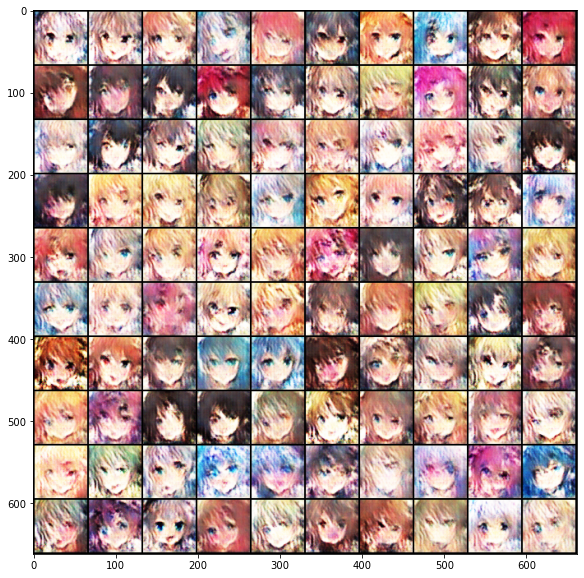

  0%|          | 0/1115 [00:00<?, ?it/s]

{'Loss_D': 0.2504, 'Loss_G': 5.2795, 'Epoch': 4, 'Step': 3346}
{'Loss_D': 0.2896, 'Loss_G': 2.817, 'Epoch': 4, 'Step': 3347}
{'Loss_D': 0.1668, 'Loss_G': 4.898, 'Epoch': 4, 'Step': 3348}
{'Loss_D': 0.0931, 'Loss_G': 4.6484, 'Epoch': 4, 'Step': 3349}
{'Loss_D': 0.0889, 'Loss_G': 4.3842, 'Epoch': 4, 'Step': 3350}
{'Loss_D': 0.0985, 'Loss_G': 3.3891, 'Epoch': 4, 'Step': 3351}
{'Loss_D': 0.1532, 'Loss_G': 5.3766, 'Epoch': 4, 'Step': 3352}
{'Loss_D': 0.1993, 'Loss_G': 3.2706, 'Epoch': 4, 'Step': 3353}
{'Loss_D': 0.1739, 'Loss_G': 4.0401, 'Epoch': 4, 'Step': 3354}
{'Loss_D': 0.1496, 'Loss_G': 4.7425, 'Epoch': 4, 'Step': 3355}
{'Loss_D': 0.1073, 'Loss_G': 4.4739, 'Epoch': 4, 'Step': 3356}
{'Loss_D': 0.0932, 'Loss_G': 3.5338, 'Epoch': 4, 'Step': 3357}
{'Loss_D': 0.2033, 'Loss_G': 3.7074, 'Epoch': 4, 'Step': 3358}
{'Loss_D': 0.237, 'Loss_G': 4.7236, 'Epoch': 4, 'Step': 3359}
{'Loss_D': 0.1483, 'Loss_G': 3.9268, 'Epoch': 4, 'Step': 3360}
{'Loss_D': 0.1267, 'Loss_G': 4.3473, 'Epoch': 4, 'Step': 3

{'Loss_D': 0.1298, 'Loss_G': 4.7035, 'Epoch': 4, 'Step': 3478}
{'Loss_D': 0.2149, 'Loss_G': 3.0148, 'Epoch': 4, 'Step': 3479}
{'Loss_D': 0.2952, 'Loss_G': 7.2743, 'Epoch': 4, 'Step': 3480}
{'Loss_D': 0.3412, 'Loss_G': 3.7398, 'Epoch': 4, 'Step': 3481}
{'Loss_D': 0.1669, 'Loss_G': 4.6729, 'Epoch': 4, 'Step': 3482}
{'Loss_D': 0.1326, 'Loss_G': 4.6564, 'Epoch': 4, 'Step': 3483}
{'Loss_D': 0.1094, 'Loss_G': 4.4922, 'Epoch': 4, 'Step': 3484}
{'Loss_D': 0.1455, 'Loss_G': 4.9128, 'Epoch': 4, 'Step': 3485}
{'Loss_D': 0.1438, 'Loss_G': 4.4765, 'Epoch': 4, 'Step': 3486}
{'Loss_D': 0.1539, 'Loss_G': 4.8376, 'Epoch': 4, 'Step': 3487}
{'Loss_D': 0.2386, 'Loss_G': 4.2497, 'Epoch': 4, 'Step': 3488}
{'Loss_D': 0.2601, 'Loss_G': 6.1163, 'Epoch': 4, 'Step': 3489}
{'Loss_D': 0.2105, 'Loss_G': 3.3154, 'Epoch': 4, 'Step': 3490}
{'Loss_D': 0.2686, 'Loss_G': 8.6023, 'Epoch': 4, 'Step': 3491}
{'Loss_D': 0.3036, 'Loss_G': 5.2264, 'Epoch': 4, 'Step': 3492}
{'Loss_D': 0.0862, 'Loss_G': 4.1885, 'Epoch': 4, 'Step'

{'Loss_D': 0.2414, 'Loss_G': 5.6163, 'Epoch': 4, 'Step': 3610}
{'Loss_D': 0.2593, 'Loss_G': 3.3403, 'Epoch': 4, 'Step': 3611}
{'Loss_D': 0.1876, 'Loss_G': 4.3896, 'Epoch': 4, 'Step': 3612}
{'Loss_D': 0.0955, 'Loss_G': 4.3921, 'Epoch': 4, 'Step': 3613}
{'Loss_D': 0.2063, 'Loss_G': 1.7005, 'Epoch': 4, 'Step': 3614}
{'Loss_D': 0.4277, 'Loss_G': 7.2701, 'Epoch': 4, 'Step': 3615}
{'Loss_D': 0.5136, 'Loss_G': 3.514, 'Epoch': 4, 'Step': 3616}
{'Loss_D': 0.1794, 'Loss_G': 2.8281, 'Epoch': 4, 'Step': 3617}
{'Loss_D': 0.2217, 'Loss_G': 5.7039, 'Epoch': 4, 'Step': 3618}
{'Loss_D': 0.0957, 'Loss_G': 5.5934, 'Epoch': 4, 'Step': 3619}
{'Loss_D': 0.09, 'Loss_G': 4.0418, 'Epoch': 4, 'Step': 3620}
{'Loss_D': 0.1476, 'Loss_G': 4.0294, 'Epoch': 4, 'Step': 3621}
{'Loss_D': 0.2195, 'Loss_G': 4.2526, 'Epoch': 4, 'Step': 3622}
{'Loss_D': 0.144, 'Loss_G': 3.9659, 'Epoch': 4, 'Step': 3623}
{'Loss_D': 0.172, 'Loss_G': 2.9693, 'Epoch': 4, 'Step': 3624}
{'Loss_D': 0.2177, 'Loss_G': 5.8035, 'Epoch': 4, 'Step': 362

{'Loss_D': 0.1496, 'Loss_G': 3.4383, 'Epoch': 4, 'Step': 3742}
{'Loss_D': 0.2603, 'Loss_G': 3.3526, 'Epoch': 4, 'Step': 3743}
{'Loss_D': 0.2206, 'Loss_G': 3.3411, 'Epoch': 4, 'Step': 3744}
{'Loss_D': 0.1992, 'Loss_G': 2.8334, 'Epoch': 4, 'Step': 3745}
{'Loss_D': 0.1651, 'Loss_G': 4.4737, 'Epoch': 4, 'Step': 3746}
{'Loss_D': 0.1091, 'Loss_G': 4.1824, 'Epoch': 4, 'Step': 3747}
{'Loss_D': 0.1488, 'Loss_G': 2.9013, 'Epoch': 4, 'Step': 3748}
{'Loss_D': 0.2069, 'Loss_G': 4.8907, 'Epoch': 4, 'Step': 3749}
{'Loss_D': 0.1166, 'Loss_G': 3.8736, 'Epoch': 4, 'Step': 3750}
{'Loss_D': 0.0944, 'Loss_G': 2.8542, 'Epoch': 4, 'Step': 3751}
{'Loss_D': 0.1656, 'Loss_G': 4.7171, 'Epoch': 4, 'Step': 3752}
{'Loss_D': 0.1384, 'Loss_G': 3.9749, 'Epoch': 4, 'Step': 3753}
{'Loss_D': 0.2233, 'Loss_G': 2.2702, 'Epoch': 4, 'Step': 3754}
{'Loss_D': 0.2115, 'Loss_G': 4.8488, 'Epoch': 4, 'Step': 3755}
{'Loss_D': 0.2222, 'Loss_G': 2.7779, 'Epoch': 4, 'Step': 3756}
{'Loss_D': 0.2226, 'Loss_G': 4.6275, 'Epoch': 4, 'Step'

{'Loss_D': 0.2022, 'Loss_G': 6.2131, 'Epoch': 4, 'Step': 3874}
{'Loss_D': 0.4643, 'Loss_G': 1.4647, 'Epoch': 4, 'Step': 3875}
{'Loss_D': 0.6609, 'Loss_G': 8.8421, 'Epoch': 4, 'Step': 3876}
{'Loss_D': 0.3903, 'Loss_G': 6.4865, 'Epoch': 4, 'Step': 3877}
{'Loss_D': 0.1636, 'Loss_G': 2.5909, 'Epoch': 4, 'Step': 3878}
{'Loss_D': 0.3601, 'Loss_G': 6.6963, 'Epoch': 4, 'Step': 3879}
{'Loss_D': 0.1395, 'Loss_G': 5.5918, 'Epoch': 4, 'Step': 3880}
{'Loss_D': 0.1417, 'Loss_G': 2.8854, 'Epoch': 4, 'Step': 3881}
{'Loss_D': 0.3344, 'Loss_G': 5.7255, 'Epoch': 4, 'Step': 3882}
{'Loss_D': 0.2583, 'Loss_G': 3.894, 'Epoch': 4, 'Step': 3883}
{'Loss_D': 0.2642, 'Loss_G': 3.7898, 'Epoch': 4, 'Step': 3884}
{'Loss_D': 0.2601, 'Loss_G': 3.9187, 'Epoch': 4, 'Step': 3885}
{'Loss_D': 0.1868, 'Loss_G': 3.7197, 'Epoch': 4, 'Step': 3886}
{'Loss_D': 0.2948, 'Loss_G': 3.2806, 'Epoch': 4, 'Step': 3887}
{'Loss_D': 0.2242, 'Loss_G': 3.5109, 'Epoch': 4, 'Step': 3888}
{'Loss_D': 0.3356, 'Loss_G': 3.5363, 'Epoch': 4, 'Step':

{'Loss_D': 0.3176, 'Loss_G': 1.8939, 'Epoch': 4, 'Step': 4006}
{'Loss_D': 0.4671, 'Loss_G': 7.2893, 'Epoch': 4, 'Step': 4007}
{'Loss_D': 0.7397, 'Loss_G': 1.3268, 'Epoch': 4, 'Step': 4008}
{'Loss_D': 0.5808, 'Loss_G': 6.8505, 'Epoch': 4, 'Step': 4009}
{'Loss_D': 0.2461, 'Loss_G': 5.015, 'Epoch': 4, 'Step': 4010}
{'Loss_D': 0.1739, 'Loss_G': 2.6602, 'Epoch': 4, 'Step': 4011}
{'Loss_D': 0.2578, 'Loss_G': 5.5654, 'Epoch': 4, 'Step': 4012}
{'Loss_D': 0.1432, 'Loss_G': 4.4314, 'Epoch': 4, 'Step': 4013}
{'Loss_D': 0.22, 'Loss_G': 2.2279, 'Epoch': 4, 'Step': 4014}
{'Loss_D': 0.2886, 'Loss_G': 6.0315, 'Epoch': 4, 'Step': 4015}
{'Loss_D': 0.3273, 'Loss_G': 3.5844, 'Epoch': 4, 'Step': 4016}
{'Loss_D': 0.3771, 'Loss_G': 2.2555, 'Epoch': 4, 'Step': 4017}
{'Loss_D': 0.2414, 'Loss_G': 5.1898, 'Epoch': 4, 'Step': 4018}
{'Loss_D': 0.3231, 'Loss_G': 3.0534, 'Epoch': 4, 'Step': 4019}
{'Loss_D': 0.219, 'Loss_G': 4.2615, 'Epoch': 4, 'Step': 4020}
{'Loss_D': 0.269, 'Loss_G': 2.7318, 'Epoch': 4, 'Step': 402

{'Loss_D': 0.2996, 'Loss_G': 2.7249, 'Epoch': 4, 'Step': 4138}
{'Loss_D': 0.3174, 'Loss_G': 5.4088, 'Epoch': 4, 'Step': 4139}
{'Loss_D': 0.3302, 'Loss_G': 2.5406, 'Epoch': 4, 'Step': 4140}
{'Loss_D': 0.4419, 'Loss_G': 7.5365, 'Epoch': 4, 'Step': 4141}
{'Loss_D': 0.4156, 'Loss_G': 3.9834, 'Epoch': 4, 'Step': 4142}
{'Loss_D': 0.187, 'Loss_G': 3.8508, 'Epoch': 4, 'Step': 4143}
{'Loss_D': 0.2094, 'Loss_G': 6.5457, 'Epoch': 4, 'Step': 4144}
{'Loss_D': 0.2541, 'Loss_G': 3.3781, 'Epoch': 4, 'Step': 4145}
{'Loss_D': 0.2716, 'Loss_G': 4.9849, 'Epoch': 4, 'Step': 4146}
{'Loss_D': 0.2216, 'Loss_G': 3.5287, 'Epoch': 4, 'Step': 4147}
{'Loss_D': 0.1782, 'Loss_G': 2.9963, 'Epoch': 4, 'Step': 4148}
{'Loss_D': 0.2168, 'Loss_G': 5.4029, 'Epoch': 4, 'Step': 4149}
{'Loss_D': 0.4568, 'Loss_G': 1.778, 'Epoch': 4, 'Step': 4150}
{'Loss_D': 0.5045, 'Loss_G': 7.3666, 'Epoch': 4, 'Step': 4151}
{'Loss_D': 0.2503, 'Loss_G': 5.3087, 'Epoch': 4, 'Step': 4152}
{'Loss_D': 0.1475, 'Loss_G': 2.5727, 'Epoch': 4, 'Step': 

{'Loss_D': 0.1381, 'Loss_G': 4.2698, 'Epoch': 4, 'Step': 4270}
{'Loss_D': 0.1644, 'Loss_G': 3.471, 'Epoch': 4, 'Step': 4271}
{'Loss_D': 0.163, 'Loss_G': 4.0541, 'Epoch': 4, 'Step': 4272}
{'Loss_D': 0.1447, 'Loss_G': 3.099, 'Epoch': 4, 'Step': 4273}
{'Loss_D': 0.2559, 'Loss_G': 5.1092, 'Epoch': 4, 'Step': 4274}
{'Loss_D': 0.2602, 'Loss_G': 1.5429, 'Epoch': 4, 'Step': 4275}
{'Loss_D': 0.5223, 'Loss_G': 9.4176, 'Epoch': 4, 'Step': 4276}
{'Loss_D': 1.0361, 'Loss_G': 1.957, 'Epoch': 4, 'Step': 4277}
{'Loss_D': 0.3499, 'Loss_G': 6.0617, 'Epoch': 4, 'Step': 4278}
{'Loss_D': 0.1145, 'Loss_G': 5.3397, 'Epoch': 4, 'Step': 4279}
{'Loss_D': 0.1254, 'Loss_G': 4.4361, 'Epoch': 4, 'Step': 4280}
{'Loss_D': 0.1923, 'Loss_G': 3.5582, 'Epoch': 4, 'Step': 4281}
{'Loss_D': 0.3311, 'Loss_G': 4.9697, 'Epoch': 4, 'Step': 4282}
{'Loss_D': 0.3779, 'Loss_G': 1.1157, 'Epoch': 4, 'Step': 4283}
{'Loss_D': 0.82, 'Loss_G': 9.3499, 'Epoch': 4, 'Step': 4284}
{'Loss_D': 0.9217, 'Loss_G': 3.9972, 'Epoch': 4, 'Step': 4285

{'Loss_D': 0.2176, 'Loss_G': 3.7124, 'Epoch': 4, 'Step': 4402}
{'Loss_D': 0.1251, 'Loss_G': 3.8877, 'Epoch': 4, 'Step': 4403}
{'Loss_D': 0.2262, 'Loss_G': 2.2371, 'Epoch': 4, 'Step': 4404}
{'Loss_D': 0.4055, 'Loss_G': 7.077, 'Epoch': 4, 'Step': 4405}
{'Loss_D': 0.5839, 'Loss_G': 2.5399, 'Epoch': 4, 'Step': 4406}
{'Loss_D': 0.3058, 'Loss_G': 4.2209, 'Epoch': 4, 'Step': 4407}
{'Loss_D': 0.1607, 'Loss_G': 4.0932, 'Epoch': 4, 'Step': 4408}
{'Loss_D': 0.1907, 'Loss_G': 3.0283, 'Epoch': 4, 'Step': 4409}
{'Loss_D': 0.1899, 'Loss_G': 3.7697, 'Epoch': 4, 'Step': 4410}
{'Loss_D': 0.2086, 'Loss_G': 2.9741, 'Epoch': 4, 'Step': 4411}
{'Loss_D': 0.1777, 'Loss_G': 3.7843, 'Epoch': 4, 'Step': 4412}
{'Loss_D': 0.1624, 'Loss_G': 3.7603, 'Epoch': 4, 'Step': 4413}
{'Loss_D': 0.2362, 'Loss_G': 2.0813, 'Epoch': 4, 'Step': 4414}
{'Loss_D': 0.3109, 'Loss_G': 6.5421, 'Epoch': 4, 'Step': 4415}
{'Loss_D': 0.5154, 'Loss_G': 1.0286, 'Epoch': 4, 'Step': 4416}
{'Loss_D': 0.4429, 'Loss_G': 5.8046, 'Epoch': 4, 'Step':

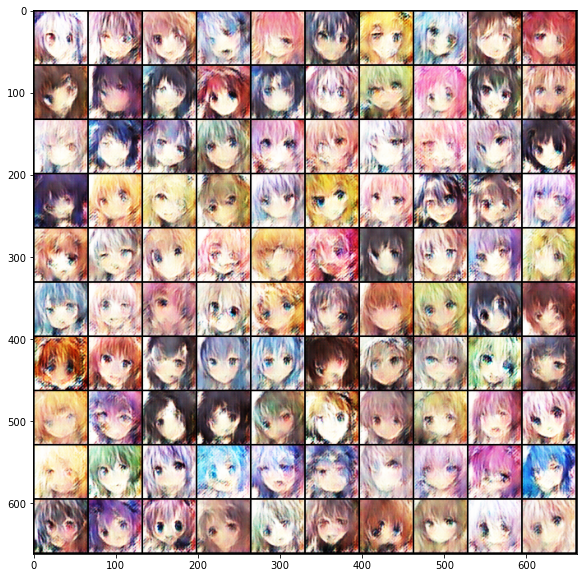

  0%|          | 0/1115 [00:00<?, ?it/s]

{'Loss_D': 1.1139, 'Loss_G': 2.6031, 'Epoch': 5, 'Step': 4461}
{'Loss_D': 0.3149, 'Loss_G': 4.0878, 'Epoch': 5, 'Step': 4462}
{'Loss_D': 0.1333, 'Loss_G': 5.9271, 'Epoch': 5, 'Step': 4463}
{'Loss_D': 0.2527, 'Loss_G': 4.0184, 'Epoch': 5, 'Step': 4464}
{'Loss_D': 0.235, 'Loss_G': 3.4711, 'Epoch': 5, 'Step': 4465}
{'Loss_D': 0.2364, 'Loss_G': 3.7283, 'Epoch': 5, 'Step': 4466}
{'Loss_D': 0.2215, 'Loss_G': 4.1525, 'Epoch': 5, 'Step': 4467}
{'Loss_D': 0.2684, 'Loss_G': 3.3898, 'Epoch': 5, 'Step': 4468}
{'Loss_D': 0.2359, 'Loss_G': 4.4213, 'Epoch': 5, 'Step': 4469}
{'Loss_D': 0.2073, 'Loss_G': 4.0136, 'Epoch': 5, 'Step': 4470}
{'Loss_D': 0.167, 'Loss_G': 3.7797, 'Epoch': 5, 'Step': 4471}
{'Loss_D': 0.3604, 'Loss_G': 5.7069, 'Epoch': 5, 'Step': 4472}
{'Loss_D': 0.226, 'Loss_G': 3.2708, 'Epoch': 5, 'Step': 4473}
{'Loss_D': 0.2232, 'Loss_G': 3.2458, 'Epoch': 5, 'Step': 4474}
{'Loss_D': 0.3528, 'Loss_G': 4.8393, 'Epoch': 5, 'Step': 4475}
{'Loss_D': 0.3262, 'Loss_G': 1.958, 'Epoch': 5, 'Step': 44

{'Loss_D': 0.2153, 'Loss_G': 1.7955, 'Epoch': 5, 'Step': 4593}
{'Loss_D': 0.3054, 'Loss_G': 4.9382, 'Epoch': 5, 'Step': 4594}
{'Loss_D': 0.2738, 'Loss_G': 3.1427, 'Epoch': 5, 'Step': 4595}
{'Loss_D': 0.1632, 'Loss_G': 2.8104, 'Epoch': 5, 'Step': 4596}
{'Loss_D': 0.2422, 'Loss_G': 3.8158, 'Epoch': 5, 'Step': 4597}
{'Loss_D': 0.1895, 'Loss_G': 3.4549, 'Epoch': 5, 'Step': 4598}
{'Loss_D': 0.1891, 'Loss_G': 3.9256, 'Epoch': 5, 'Step': 4599}
{'Loss_D': 0.1414, 'Loss_G': 2.8574, 'Epoch': 5, 'Step': 4600}
{'Loss_D': 0.1697, 'Loss_G': 4.1239, 'Epoch': 5, 'Step': 4601}
{'Loss_D': 0.2004, 'Loss_G': 2.1456, 'Epoch': 5, 'Step': 4602}
{'Loss_D': 0.3306, 'Loss_G': 6.3614, 'Epoch': 5, 'Step': 4603}
{'Loss_D': 0.5432, 'Loss_G': 1.2889, 'Epoch': 5, 'Step': 4604}
{'Loss_D': 0.4593, 'Loss_G': 6.3038, 'Epoch': 5, 'Step': 4605}
{'Loss_D': 0.2359, 'Loss_G': 4.5659, 'Epoch': 5, 'Step': 4606}
{'Loss_D': 0.1185, 'Loss_G': 3.0232, 'Epoch': 5, 'Step': 4607}
{'Loss_D': 0.1421, 'Loss_G': 5.2898, 'Epoch': 5, 'Step'

{'Loss_D': 0.1489, 'Loss_G': 3.8509, 'Epoch': 5, 'Step': 4725}
{'Loss_D': 0.1489, 'Loss_G': 2.4718, 'Epoch': 5, 'Step': 4726}
{'Loss_D': 0.2626, 'Loss_G': 5.4897, 'Epoch': 5, 'Step': 4727}
{'Loss_D': 0.3451, 'Loss_G': 1.8156, 'Epoch': 5, 'Step': 4728}
{'Loss_D': 0.3262, 'Loss_G': 5.7839, 'Epoch': 5, 'Step': 4729}
{'Loss_D': 0.2112, 'Loss_G': 3.9537, 'Epoch': 5, 'Step': 4730}
{'Loss_D': 0.1346, 'Loss_G': 2.8447, 'Epoch': 5, 'Step': 4731}
{'Loss_D': 0.1741, 'Loss_G': 4.5291, 'Epoch': 5, 'Step': 4732}
{'Loss_D': 0.1664, 'Loss_G': 3.5107, 'Epoch': 5, 'Step': 4733}
{'Loss_D': 0.194, 'Loss_G': 3.8057, 'Epoch': 5, 'Step': 4734}
{'Loss_D': 0.1592, 'Loss_G': 4.0291, 'Epoch': 5, 'Step': 4735}
{'Loss_D': 0.1762, 'Loss_G': 3.5032, 'Epoch': 5, 'Step': 4736}
{'Loss_D': 0.1914, 'Loss_G': 3.8433, 'Epoch': 5, 'Step': 4737}
{'Loss_D': 0.1746, 'Loss_G': 2.8296, 'Epoch': 5, 'Step': 4738}
{'Loss_D': 0.202, 'Loss_G': 5.7695, 'Epoch': 5, 'Step': 4739}
{'Loss_D': 0.3113, 'Loss_G': 2.1153, 'Epoch': 5, 'Step': 

{'Loss_D': 0.1245, 'Loss_G': 3.8497, 'Epoch': 5, 'Step': 4857}
{'Loss_D': 0.1704, 'Loss_G': 3.935, 'Epoch': 5, 'Step': 4858}
{'Loss_D': 0.1493, 'Loss_G': 4.2434, 'Epoch': 5, 'Step': 4859}
{'Loss_D': 0.1911, 'Loss_G': 2.5825, 'Epoch': 5, 'Step': 4860}
{'Loss_D': 0.2519, 'Loss_G': 3.346, 'Epoch': 5, 'Step': 4861}
{'Loss_D': 0.2623, 'Loss_G': 4.8394, 'Epoch': 5, 'Step': 4862}
{'Loss_D': 0.2939, 'Loss_G': 1.5448, 'Epoch': 5, 'Step': 4863}
{'Loss_D': 0.5417, 'Loss_G': 7.9381, 'Epoch': 5, 'Step': 4864}
{'Loss_D': 0.968, 'Loss_G': 1.4092, 'Epoch': 5, 'Step': 4865}
{'Loss_D': 0.4074, 'Loss_G': 5.3244, 'Epoch': 5, 'Step': 4866}
{'Loss_D': 0.069, 'Loss_G': 5.6046, 'Epoch': 5, 'Step': 4867}
{'Loss_D': 0.0824, 'Loss_G': 4.0638, 'Epoch': 5, 'Step': 4868}
{'Loss_D': 0.1956, 'Loss_G': 3.7008, 'Epoch': 5, 'Step': 4869}
{'Loss_D': 0.2535, 'Loss_G': 3.7188, 'Epoch': 5, 'Step': 4870}
{'Loss_D': 0.2163, 'Loss_G': 3.1641, 'Epoch': 5, 'Step': 4871}
{'Loss_D': 0.2225, 'Loss_G': 3.1506, 'Epoch': 5, 'Step': 48

{'Loss_D': 0.4545, 'Loss_G': 7.0253, 'Epoch': 5, 'Step': 4989}
{'Loss_D': 0.7079, 'Loss_G': 1.7384, 'Epoch': 5, 'Step': 4990}
{'Loss_D': 0.5935, 'Loss_G': 7.1563, 'Epoch': 5, 'Step': 4991}
{'Loss_D': 0.3955, 'Loss_G': 3.7883, 'Epoch': 5, 'Step': 4992}
{'Loss_D': 0.2114, 'Loss_G': 3.2363, 'Epoch': 5, 'Step': 4993}
{'Loss_D': 0.2425, 'Loss_G': 5.7626, 'Epoch': 5, 'Step': 4994}
{'Loss_D': 0.4713, 'Loss_G': 1.3194, 'Epoch': 5, 'Step': 4995}
{'Loss_D': 0.4745, 'Loss_G': 6.5763, 'Epoch': 5, 'Step': 4996}
{'Loss_D': 0.2779, 'Loss_G': 4.4603, 'Epoch': 5, 'Step': 4997}
{'Loss_D': 0.1259, 'Loss_G': 2.2713, 'Epoch': 5, 'Step': 4998}
{'Loss_D': 0.3024, 'Loss_G': 5.7022, 'Epoch': 5, 'Step': 4999}
{'Loss_D': 0.1525, 'Loss_G': 4.579, 'Epoch': 5, 'Step': 5000}
{'Loss_D': 0.1147, 'Loss_G': 3.3361, 'Epoch': 5, 'Step': 5001}
{'Loss_D': 0.1945, 'Loss_G': 4.1912, 'Epoch': 5, 'Step': 5002}
{'Loss_D': 0.2683, 'Loss_G': 2.0105, 'Epoch': 5, 'Step': 5003}
{'Loss_D': 0.3673, 'Loss_G': 5.8771, 'Epoch': 5, 'Step':

{'Loss_D': 0.111, 'Loss_G': 3.4531, 'Epoch': 5, 'Step': 5121}
{'Loss_D': 0.1559, 'Loss_G': 3.5293, 'Epoch': 5, 'Step': 5122}
{'Loss_D': 0.2214, 'Loss_G': 2.3981, 'Epoch': 5, 'Step': 5123}
{'Loss_D': 0.2546, 'Loss_G': 5.4929, 'Epoch': 5, 'Step': 5124}
{'Loss_D': 0.4214, 'Loss_G': 0.953, 'Epoch': 5, 'Step': 5125}
{'Loss_D': 0.6781, 'Loss_G': 7.8441, 'Epoch': 5, 'Step': 5126}
{'Loss_D': 0.5866, 'Loss_G': 3.7902, 'Epoch': 5, 'Step': 5127}
{'Loss_D': 0.1125, 'Loss_G': 2.5531, 'Epoch': 5, 'Step': 5128}
{'Loss_D': 0.2159, 'Loss_G': 5.2527, 'Epoch': 5, 'Step': 5129}
{'Loss_D': 0.1257, 'Loss_G': 3.9153, 'Epoch': 5, 'Step': 5130}
{'Loss_D': 0.1066, 'Loss_G': 3.5166, 'Epoch': 5, 'Step': 5131}
{'Loss_D': 0.1834, 'Loss_G': 3.7424, 'Epoch': 5, 'Step': 5132}
{'Loss_D': 0.2292, 'Loss_G': 3.0584, 'Epoch': 5, 'Step': 5133}
{'Loss_D': 0.2229, 'Loss_G': 4.8282, 'Epoch': 5, 'Step': 5134}
{'Loss_D': 0.1774, 'Loss_G': 3.2387, 'Epoch': 5, 'Step': 5135}
{'Loss_D': 0.193, 'Loss_G': 3.1324, 'Epoch': 5, 'Step': 5

{'Loss_D': 0.1178, 'Loss_G': 2.1831, 'Epoch': 5, 'Step': 5253}
{'Loss_D': 0.2157, 'Loss_G': 5.1209, 'Epoch': 5, 'Step': 5254}
{'Loss_D': 0.2329, 'Loss_G': 2.8725, 'Epoch': 5, 'Step': 5255}
{'Loss_D': 0.1878, 'Loss_G': 3.9279, 'Epoch': 5, 'Step': 5256}
{'Loss_D': 0.1629, 'Loss_G': 2.9159, 'Epoch': 5, 'Step': 5257}
{'Loss_D': 0.1753, 'Loss_G': 3.6546, 'Epoch': 5, 'Step': 5258}
{'Loss_D': 0.1797, 'Loss_G': 3.1233, 'Epoch': 5, 'Step': 5259}
{'Loss_D': 0.2614, 'Loss_G': 3.6398, 'Epoch': 5, 'Step': 5260}
{'Loss_D': 0.1661, 'Loss_G': 3.4849, 'Epoch': 5, 'Step': 5261}
{'Loss_D': 0.2022, 'Loss_G': 2.6063, 'Epoch': 5, 'Step': 5262}
{'Loss_D': 0.1567, 'Loss_G': 4.0987, 'Epoch': 5, 'Step': 5263}
{'Loss_D': 0.1635, 'Loss_G': 2.8498, 'Epoch': 5, 'Step': 5264}
{'Loss_D': 0.1939, 'Loss_G': 3.9959, 'Epoch': 5, 'Step': 5265}
{'Loss_D': 0.1165, 'Loss_G': 4.3892, 'Epoch': 5, 'Step': 5266}
{'Loss_D': 0.2656, 'Loss_G': 1.1545, 'Epoch': 5, 'Step': 5267}
{'Loss_D': 0.662, 'Loss_G': 7.5563, 'Epoch': 5, 'Step':

{'Loss_D': 0.2646, 'Loss_G': 2.7364, 'Epoch': 5, 'Step': 5385}
{'Loss_D': 0.2423, 'Loss_G': 4.5447, 'Epoch': 5, 'Step': 5386}
{'Loss_D': 0.1881, 'Loss_G': 3.2672, 'Epoch': 5, 'Step': 5387}
{'Loss_D': 0.171, 'Loss_G': 3.0252, 'Epoch': 5, 'Step': 5388}
{'Loss_D': 0.1574, 'Loss_G': 4.4373, 'Epoch': 5, 'Step': 5389}
{'Loss_D': 0.2758, 'Loss_G': 2.2208, 'Epoch': 5, 'Step': 5390}
{'Loss_D': 0.255, 'Loss_G': 3.455, 'Epoch': 5, 'Step': 5391}
{'Loss_D': 0.146, 'Loss_G': 4.2357, 'Epoch': 5, 'Step': 5392}
{'Loss_D': 0.2012, 'Loss_G': 2.0814, 'Epoch': 5, 'Step': 5393}
{'Loss_D': 0.2637, 'Loss_G': 5.4025, 'Epoch': 5, 'Step': 5394}
{'Loss_D': 0.2606, 'Loss_G': 2.9372, 'Epoch': 5, 'Step': 5395}
{'Loss_D': 0.1837, 'Loss_G': 3.4852, 'Epoch': 5, 'Step': 5396}
{'Loss_D': 0.1786, 'Loss_G': 3.7154, 'Epoch': 5, 'Step': 5397}
{'Loss_D': 0.1445, 'Loss_G': 3.4475, 'Epoch': 5, 'Step': 5398}
{'Loss_D': 0.1609, 'Loss_G': 3.113, 'Epoch': 5, 'Step': 5399}
{'Loss_D': 0.2183, 'Loss_G': 5.668, 'Epoch': 5, 'Step': 5400

{'Loss_D': 0.1318, 'Loss_G': 4.3491, 'Epoch': 5, 'Step': 5517}
{'Loss_D': 0.1482, 'Loss_G': 1.8913, 'Epoch': 5, 'Step': 5518}
{'Loss_D': 0.3324, 'Loss_G': 5.715, 'Epoch': 5, 'Step': 5519}
{'Loss_D': 0.1833, 'Loss_G': 4.9135, 'Epoch': 5, 'Step': 5520}
{'Loss_D': 0.1375, 'Loss_G': 2.4263, 'Epoch': 5, 'Step': 5521}
{'Loss_D': 0.3019, 'Loss_G': 6.088, 'Epoch': 5, 'Step': 5522}
{'Loss_D': 0.2535, 'Loss_G': 3.5595, 'Epoch': 5, 'Step': 5523}
{'Loss_D': 0.2193, 'Loss_G': 2.3722, 'Epoch': 5, 'Step': 5524}
{'Loss_D': 0.2569, 'Loss_G': 5.1265, 'Epoch': 5, 'Step': 5525}
{'Loss_D': 0.478, 'Loss_G': 1.0378, 'Epoch': 5, 'Step': 5526}
{'Loss_D': 0.5611, 'Loss_G': 7.879, 'Epoch': 5, 'Step': 5527}
{'Loss_D': 0.3325, 'Loss_G': 4.5415, 'Epoch': 5, 'Step': 5528}
{'Loss_D': 0.1665, 'Loss_G': 2.089, 'Epoch': 5, 'Step': 5529}
{'Loss_D': 0.3547, 'Loss_G': 6.7365, 'Epoch': 5, 'Step': 5530}
{'Loss_D': 0.4665, 'Loss_G': 1.8377, 'Epoch': 5, 'Step': 5531}
{'Loss_D': 0.5463, 'Loss_G': 5.6316, 'Epoch': 5, 'Step': 553

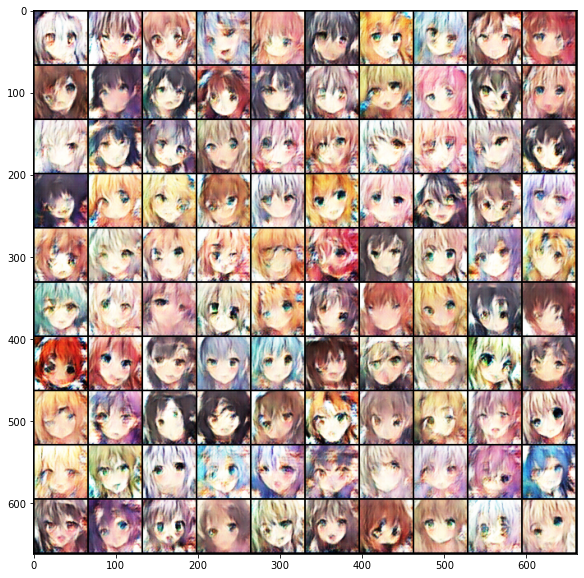

  0%|          | 0/1115 [00:00<?, ?it/s]

{'Loss_D': 0.3221, 'Loss_G': 1.4637, 'Epoch': 6, 'Step': 5576}
{'Loss_D': 0.4061, 'Loss_G': 6.8965, 'Epoch': 6, 'Step': 5577}
{'Loss_D': 0.4177, 'Loss_G': 3.5194, 'Epoch': 6, 'Step': 5578}
{'Loss_D': 0.1314, 'Loss_G': 2.7492, 'Epoch': 6, 'Step': 5579}
{'Loss_D': 0.2214, 'Loss_G': 4.8928, 'Epoch': 6, 'Step': 5580}
{'Loss_D': 0.167, 'Loss_G': 3.4276, 'Epoch': 6, 'Step': 5581}
{'Loss_D': 0.1601, 'Loss_G': 2.6253, 'Epoch': 6, 'Step': 5582}
{'Loss_D': 0.2438, 'Loss_G': 5.6388, 'Epoch': 6, 'Step': 5583}
{'Loss_D': 0.3934, 'Loss_G': 1.6229, 'Epoch': 6, 'Step': 5584}
{'Loss_D': 0.4319, 'Loss_G': 6.2193, 'Epoch': 6, 'Step': 5585}
{'Loss_D': 0.4368, 'Loss_G': 2.5486, 'Epoch': 6, 'Step': 5586}
{'Loss_D': 0.3119, 'Loss_G': 5.7215, 'Epoch': 6, 'Step': 5587}
{'Loss_D': 0.1436, 'Loss_G': 4.1582, 'Epoch': 6, 'Step': 5588}
{'Loss_D': 0.1543, 'Loss_G': 2.8996, 'Epoch': 6, 'Step': 5589}
{'Loss_D': 0.146, 'Loss_G': 4.405, 'Epoch': 6, 'Step': 5590}
{'Loss_D': 0.2086, 'Loss_G': 2.3292, 'Epoch': 6, 'Step': 5

{'Loss_D': 0.1421, 'Loss_G': 3.3822, 'Epoch': 6, 'Step': 5708}
{'Loss_D': 0.1862, 'Loss_G': 3.7076, 'Epoch': 6, 'Step': 5709}
{'Loss_D': 0.1668, 'Loss_G': 4.1594, 'Epoch': 6, 'Step': 5710}
{'Loss_D': 0.2586, 'Loss_G': 1.3997, 'Epoch': 6, 'Step': 5711}
{'Loss_D': 0.372, 'Loss_G': 6.1616, 'Epoch': 6, 'Step': 5712}
{'Loss_D': 0.4186, 'Loss_G': 2.0889, 'Epoch': 6, 'Step': 5713}
{'Loss_D': 0.2017, 'Loss_G': 3.5177, 'Epoch': 6, 'Step': 5714}
{'Loss_D': 0.1204, 'Loss_G': 4.8351, 'Epoch': 6, 'Step': 5715}
{'Loss_D': 0.2086, 'Loss_G': 2.5621, 'Epoch': 6, 'Step': 5716}
{'Loss_D': 0.2279, 'Loss_G': 3.0723, 'Epoch': 6, 'Step': 5717}
{'Loss_D': 0.1906, 'Loss_G': 3.7813, 'Epoch': 6, 'Step': 5718}
{'Loss_D': 0.2117, 'Loss_G': 2.355, 'Epoch': 6, 'Step': 5719}
{'Loss_D': 0.266, 'Loss_G': 4.5209, 'Epoch': 6, 'Step': 5720}
{'Loss_D': 0.242, 'Loss_G': 2.2312, 'Epoch': 6, 'Step': 5721}
{'Loss_D': 0.2085, 'Loss_G': 4.1144, 'Epoch': 6, 'Step': 5722}
{'Loss_D': 0.1518, 'Loss_G': 3.3274, 'Epoch': 6, 'Step': 57

{'Loss_D': 0.1495, 'Loss_G': 4.8444, 'Epoch': 6, 'Step': 5840}
{'Loss_D': 0.1754, 'Loss_G': 3.1113, 'Epoch': 6, 'Step': 5841}
{'Loss_D': 0.2158, 'Loss_G': 2.2334, 'Epoch': 6, 'Step': 5842}
{'Loss_D': 0.2115, 'Loss_G': 4.8407, 'Epoch': 6, 'Step': 5843}
{'Loss_D': 0.2559, 'Loss_G': 3.0146, 'Epoch': 6, 'Step': 5844}
{'Loss_D': 0.196, 'Loss_G': 3.4153, 'Epoch': 6, 'Step': 5845}
{'Loss_D': 0.1549, 'Loss_G': 3.8968, 'Epoch': 6, 'Step': 5846}
{'Loss_D': 0.1651, 'Loss_G': 2.4456, 'Epoch': 6, 'Step': 5847}
{'Loss_D': 0.2054, 'Loss_G': 5.7436, 'Epoch': 6, 'Step': 5848}
{'Loss_D': 0.4036, 'Loss_G': 0.948, 'Epoch': 6, 'Step': 5849}
{'Loss_D': 0.5062, 'Loss_G': 7.154, 'Epoch': 6, 'Step': 5850}
{'Loss_D': 0.2913, 'Loss_G': 4.9725, 'Epoch': 6, 'Step': 5851}
{'Loss_D': 0.1874, 'Loss_G': 2.1138, 'Epoch': 6, 'Step': 5852}
{'Loss_D': 0.2916, 'Loss_G': 5.1888, 'Epoch': 6, 'Step': 5853}
{'Loss_D': 0.1541, 'Loss_G': 4.2462, 'Epoch': 6, 'Step': 5854}
{'Loss_D': 0.2355, 'Loss_G': 1.7533, 'Epoch': 6, 'Step': 5

{'Loss_D': 0.5592, 'Loss_G': 1.2808, 'Epoch': 6, 'Step': 5972}
{'Loss_D': 0.5842, 'Loss_G': 6.242, 'Epoch': 6, 'Step': 5973}
{'Loss_D': 0.3367, 'Loss_G': 4.0182, 'Epoch': 6, 'Step': 5974}
{'Loss_D': 0.1509, 'Loss_G': 3.5371, 'Epoch': 6, 'Step': 5975}
{'Loss_D': 0.1498, 'Loss_G': 4.5406, 'Epoch': 6, 'Step': 5976}
{'Loss_D': 0.1327, 'Loss_G': 3.6295, 'Epoch': 6, 'Step': 5977}
{'Loss_D': 0.1405, 'Loss_G': 2.5718, 'Epoch': 6, 'Step': 5978}
{'Loss_D': 0.1987, 'Loss_G': 5.0911, 'Epoch': 6, 'Step': 5979}
{'Loss_D': 0.2533, 'Loss_G': 2.3615, 'Epoch': 6, 'Step': 5980}
{'Loss_D': 0.2275, 'Loss_G': 4.0544, 'Epoch': 6, 'Step': 5981}
{'Loss_D': 0.1718, 'Loss_G': 2.8832, 'Epoch': 6, 'Step': 5982}
{'Loss_D': 0.1949, 'Loss_G': 3.9324, 'Epoch': 6, 'Step': 5983}
{'Loss_D': 0.1263, 'Loss_G': 4.5373, 'Epoch': 6, 'Step': 5984}
{'Loss_D': 0.1648, 'Loss_G': 3.2215, 'Epoch': 6, 'Step': 5985}
{'Loss_D': 0.1009, 'Loss_G': 3.1633, 'Epoch': 6, 'Step': 5986}
{'Loss_D': 0.1656, 'Loss_G': 3.7629, 'Epoch': 6, 'Step':

{'Loss_D': 0.1406, 'Loss_G': 4.4804, 'Epoch': 6, 'Step': 6104}
{'Loss_D': 0.1495, 'Loss_G': 2.6963, 'Epoch': 6, 'Step': 6105}
{'Loss_D': 0.1866, 'Loss_G': 4.0303, 'Epoch': 6, 'Step': 6106}
{'Loss_D': 0.229, 'Loss_G': 2.9911, 'Epoch': 6, 'Step': 6107}
{'Loss_D': 0.1778, 'Loss_G': 3.4859, 'Epoch': 6, 'Step': 6108}
{'Loss_D': 0.1126, 'Loss_G': 3.5693, 'Epoch': 6, 'Step': 6109}
{'Loss_D': 0.2044, 'Loss_G': 2.3273, 'Epoch': 6, 'Step': 6110}
{'Loss_D': 0.2158, 'Loss_G': 4.4378, 'Epoch': 6, 'Step': 6111}
{'Loss_D': 0.3144, 'Loss_G': 1.5959, 'Epoch': 6, 'Step': 6112}
{'Loss_D': 0.2941, 'Loss_G': 5.7109, 'Epoch': 6, 'Step': 6113}
{'Loss_D': 0.381, 'Loss_G': 2.1515, 'Epoch': 6, 'Step': 6114}
{'Loss_D': 0.3554, 'Loss_G': 5.435, 'Epoch': 6, 'Step': 6115}
{'Loss_D': 0.2189, 'Loss_G': 3.5474, 'Epoch': 6, 'Step': 6116}
{'Loss_D': 0.1045, 'Loss_G': 2.2588, 'Epoch': 6, 'Step': 6117}
{'Loss_D': 0.1556, 'Loss_G': 4.4382, 'Epoch': 6, 'Step': 6118}
{'Loss_D': 0.1653, 'Loss_G': 3.2258, 'Epoch': 6, 'Step': 6

{'Loss_D': 0.1148, 'Loss_G': 3.8749, 'Epoch': 6, 'Step': 6236}
{'Loss_D': 0.1883, 'Loss_G': 3.7675, 'Epoch': 6, 'Step': 6237}
{'Loss_D': 0.2877, 'Loss_G': 1.5672, 'Epoch': 6, 'Step': 6238}
{'Loss_D': 0.4623, 'Loss_G': 6.1302, 'Epoch': 6, 'Step': 6239}
{'Loss_D': 0.7152, 'Loss_G': 1.8816, 'Epoch': 6, 'Step': 6240}
{'Loss_D': 0.4283, 'Loss_G': 5.1944, 'Epoch': 6, 'Step': 6241}
{'Loss_D': 0.1968, 'Loss_G': 3.8079, 'Epoch': 6, 'Step': 6242}
{'Loss_D': 0.1247, 'Loss_G': 3.2937, 'Epoch': 6, 'Step': 6243}
{'Loss_D': 0.2369, 'Loss_G': 4.8439, 'Epoch': 6, 'Step': 6244}
{'Loss_D': 0.2071, 'Loss_G': 3.4796, 'Epoch': 6, 'Step': 6245}
{'Loss_D': 0.2287, 'Loss_G': 3.4719, 'Epoch': 6, 'Step': 6246}
{'Loss_D': 0.1969, 'Loss_G': 3.9775, 'Epoch': 6, 'Step': 6247}
{'Loss_D': 0.158, 'Loss_G': 3.2561, 'Epoch': 6, 'Step': 6248}
{'Loss_D': 0.2246, 'Loss_G': 4.2302, 'Epoch': 6, 'Step': 6249}
{'Loss_D': 0.2078, 'Loss_G': 2.7311, 'Epoch': 6, 'Step': 6250}
{'Loss_D': 0.2275, 'Loss_G': 4.6184, 'Epoch': 6, 'Step':

{'Loss_D': 0.3936, 'Loss_G': 1.6199, 'Epoch': 6, 'Step': 6368}
{'Loss_D': 0.3041, 'Loss_G': 6.3653, 'Epoch': 6, 'Step': 6369}
{'Loss_D': 0.2057, 'Loss_G': 3.2676, 'Epoch': 6, 'Step': 6370}
{'Loss_D': 0.1098, 'Loss_G': 3.0877, 'Epoch': 6, 'Step': 6371}
{'Loss_D': 0.1737, 'Loss_G': 5.8557, 'Epoch': 6, 'Step': 6372}
{'Loss_D': 0.329, 'Loss_G': 1.8801, 'Epoch': 6, 'Step': 6373}
{'Loss_D': 0.4141, 'Loss_G': 6.0023, 'Epoch': 6, 'Step': 6374}
{'Loss_D': 0.4406, 'Loss_G': 1.5461, 'Epoch': 6, 'Step': 6375}
{'Loss_D': 0.3186, 'Loss_G': 4.4559, 'Epoch': 6, 'Step': 6376}
{'Loss_D': 0.1473, 'Loss_G': 5.0117, 'Epoch': 6, 'Step': 6377}
{'Loss_D': 0.1812, 'Loss_G': 2.6171, 'Epoch': 6, 'Step': 6378}
{'Loss_D': 0.2358, 'Loss_G': 4.7157, 'Epoch': 6, 'Step': 6379}
{'Loss_D': 0.196, 'Loss_G': 2.9909, 'Epoch': 6, 'Step': 6380}
{'Loss_D': 0.2383, 'Loss_G': 2.6093, 'Epoch': 6, 'Step': 6381}
{'Loss_D': 0.3712, 'Loss_G': 6.3294, 'Epoch': 6, 'Step': 6382}
{'Loss_D': 0.6796, 'Loss_G': 0.7751, 'Epoch': 6, 'Step': 

{'Loss_D': 0.2345, 'Loss_G': 3.4814, 'Epoch': 6, 'Step': 6500}
{'Loss_D': 0.1928, 'Loss_G': 2.6079, 'Epoch': 6, 'Step': 6501}
{'Loss_D': 0.1875, 'Loss_G': 3.6002, 'Epoch': 6, 'Step': 6502}
{'Loss_D': 0.1364, 'Loss_G': 3.4207, 'Epoch': 6, 'Step': 6503}
{'Loss_D': 0.2611, 'Loss_G': 1.6954, 'Epoch': 6, 'Step': 6504}
{'Loss_D': 0.3249, 'Loss_G': 7.2898, 'Epoch': 6, 'Step': 6505}
{'Loss_D': 0.7882, 'Loss_G': 1.1846, 'Epoch': 6, 'Step': 6506}
{'Loss_D': 0.5662, 'Loss_G': 6.3364, 'Epoch': 6, 'Step': 6507}
{'Loss_D': 0.1712, 'Loss_G': 5.0179, 'Epoch': 6, 'Step': 6508}
{'Loss_D': 0.1615, 'Loss_G': 2.1549, 'Epoch': 6, 'Step': 6509}
{'Loss_D': 0.3272, 'Loss_G': 5.6557, 'Epoch': 6, 'Step': 6510}
{'Loss_D': 0.2113, 'Loss_G': 3.0535, 'Epoch': 6, 'Step': 6511}
{'Loss_D': 0.2269, 'Loss_G': 4.3332, 'Epoch': 6, 'Step': 6512}
{'Loss_D': 0.1732, 'Loss_G': 2.7484, 'Epoch': 6, 'Step': 6513}
{'Loss_D': 0.2756, 'Loss_G': 3.0685, 'Epoch': 6, 'Step': 6514}
{'Loss_D': 0.2461, 'Loss_G': 5.2593, 'Epoch': 6, 'Step'

{'Loss_D': 0.1432, 'Loss_G': 3.6, 'Epoch': 6, 'Step': 6632}
{'Loss_D': 0.1852, 'Loss_G': 1.8479, 'Epoch': 6, 'Step': 6633}
{'Loss_D': 0.335, 'Loss_G': 6.596, 'Epoch': 6, 'Step': 6634}
{'Loss_D': 0.529, 'Loss_G': 1.6301, 'Epoch': 6, 'Step': 6635}
{'Loss_D': 0.5833, 'Loss_G': 5.4461, 'Epoch': 6, 'Step': 6636}
{'Loss_D': 0.2763, 'Loss_G': 2.8409, 'Epoch': 6, 'Step': 6637}
{'Loss_D': 0.1537, 'Loss_G': 3.1538, 'Epoch': 6, 'Step': 6638}
{'Loss_D': 0.1856, 'Loss_G': 5.5451, 'Epoch': 6, 'Step': 6639}
{'Loss_D': 0.1996, 'Loss_G': 3.7583, 'Epoch': 6, 'Step': 6640}
{'Loss_D': 0.1415, 'Loss_G': 1.8851, 'Epoch': 6, 'Step': 6641}
{'Loss_D': 0.2483, 'Loss_G': 4.6433, 'Epoch': 6, 'Step': 6642}
{'Loss_D': 0.1939, 'Loss_G': 2.9078, 'Epoch': 6, 'Step': 6643}
{'Loss_D': 0.1816, 'Loss_G': 3.4018, 'Epoch': 6, 'Step': 6644}
{'Loss_D': 0.1134, 'Loss_G': 3.7874, 'Epoch': 6, 'Step': 6645}
{'Loss_D': 0.1289, 'Loss_G': 3.6233, 'Epoch': 6, 'Step': 6646}
{'Loss_D': 0.1221, 'Loss_G': 2.7779, 'Epoch': 6, 'Step': 6647

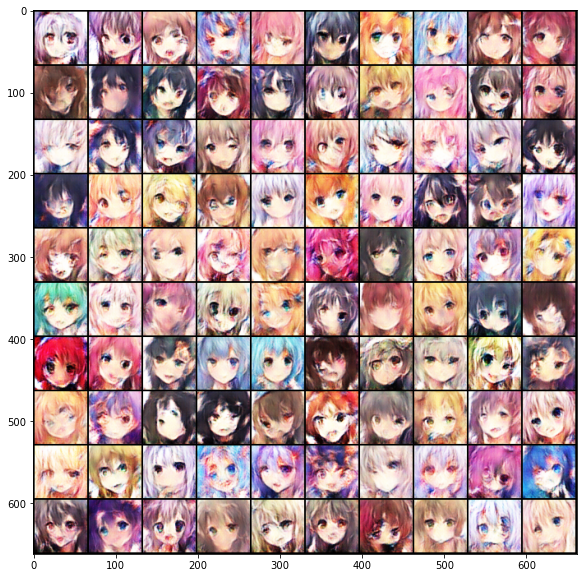

  0%|          | 0/1115 [00:00<?, ?it/s]

{'Loss_D': 0.1601, 'Loss_G': 4.1384, 'Epoch': 7, 'Step': 6691}
{'Loss_D': 0.139, 'Loss_G': 2.4875, 'Epoch': 7, 'Step': 6692}
{'Loss_D': 0.1858, 'Loss_G': 4.8912, 'Epoch': 7, 'Step': 6693}
{'Loss_D': 0.15, 'Loss_G': 3.5143, 'Epoch': 7, 'Step': 6694}
{'Loss_D': 0.1291, 'Loss_G': 2.7096, 'Epoch': 7, 'Step': 6695}
{'Loss_D': 0.1466, 'Loss_G': 3.8297, 'Epoch': 7, 'Step': 6696}
{'Loss_D': 0.178, 'Loss_G': 2.3139, 'Epoch': 7, 'Step': 6697}
{'Loss_D': 0.1828, 'Loss_G': 3.3835, 'Epoch': 7, 'Step': 6698}
{'Loss_D': 0.2405, 'Loss_G': 2.3349, 'Epoch': 7, 'Step': 6699}
{'Loss_D': 0.1962, 'Loss_G': 4.5852, 'Epoch': 7, 'Step': 6700}
{'Loss_D': 0.1807, 'Loss_G': 3.53, 'Epoch': 7, 'Step': 6701}
{'Loss_D': 0.1201, 'Loss_G': 2.2354, 'Epoch': 7, 'Step': 6702}
{'Loss_D': 0.2391, 'Loss_G': 4.9036, 'Epoch': 7, 'Step': 6703}
{'Loss_D': 0.2263, 'Loss_G': 2.8251, 'Epoch': 7, 'Step': 6704}
{'Loss_D': 0.145, 'Loss_G': 2.7999, 'Epoch': 7, 'Step': 6705}
{'Loss_D': 0.1977, 'Loss_G': 4.4668, 'Epoch': 7, 'Step': 6706}

{'Loss_D': 0.154, 'Loss_G': 2.2886, 'Epoch': 7, 'Step': 6823}
{'Loss_D': 0.2128, 'Loss_G': 4.5062, 'Epoch': 7, 'Step': 6824}
{'Loss_D': 0.1899, 'Loss_G': 2.59, 'Epoch': 7, 'Step': 6825}
{'Loss_D': 0.1463, 'Loss_G': 4.3961, 'Epoch': 7, 'Step': 6826}
{'Loss_D': 0.183, 'Loss_G': 2.5733, 'Epoch': 7, 'Step': 6827}
{'Loss_D': 0.18, 'Loss_G': 4.387, 'Epoch': 7, 'Step': 6828}
{'Loss_D': 0.271, 'Loss_G': 2.2026, 'Epoch': 7, 'Step': 6829}
{'Loss_D': 0.244, 'Loss_G': 5.1698, 'Epoch': 7, 'Step': 6830}
{'Loss_D': 0.2387, 'Loss_G': 2.6552, 'Epoch': 7, 'Step': 6831}
{'Loss_D': 0.1546, 'Loss_G': 3.6289, 'Epoch': 7, 'Step': 6832}
{'Loss_D': 0.1743, 'Loss_G': 3.3265, 'Epoch': 7, 'Step': 6833}
{'Loss_D': 0.1354, 'Loss_G': 2.7535, 'Epoch': 7, 'Step': 6834}
{'Loss_D': 0.1789, 'Loss_G': 4.8996, 'Epoch': 7, 'Step': 6835}
{'Loss_D': 0.1475, 'Loss_G': 3.3365, 'Epoch': 7, 'Step': 6836}
{'Loss_D': 0.152, 'Loss_G': 2.4377, 'Epoch': 7, 'Step': 6837}
{'Loss_D': 0.158, 'Loss_G': 4.2702, 'Epoch': 7, 'Step': 6838}
{'L

{'Loss_D': 0.286, 'Loss_G': 6.7754, 'Epoch': 7, 'Step': 6955}
{'Loss_D': 0.399, 'Loss_G': 2.0532, 'Epoch': 7, 'Step': 6956}
{'Loss_D': 0.3231, 'Loss_G': 5.4157, 'Epoch': 7, 'Step': 6957}
{'Loss_D': 0.1919, 'Loss_G': 3.271, 'Epoch': 7, 'Step': 6958}
{'Loss_D': 0.1378, 'Loss_G': 2.727, 'Epoch': 7, 'Step': 6959}
{'Loss_D': 0.2271, 'Loss_G': 4.9252, 'Epoch': 7, 'Step': 6960}
{'Loss_D': 0.231, 'Loss_G': 3.1138, 'Epoch': 7, 'Step': 6961}
{'Loss_D': 0.1695, 'Loss_G': 2.2117, 'Epoch': 7, 'Step': 6962}
{'Loss_D': 0.2347, 'Loss_G': 5.0774, 'Epoch': 7, 'Step': 6963}
{'Loss_D': 0.234, 'Loss_G': 3.2971, 'Epoch': 7, 'Step': 6964}
{'Loss_D': 0.1393, 'Loss_G': 2.2662, 'Epoch': 7, 'Step': 6965}
{'Loss_D': 0.2518, 'Loss_G': 4.8263, 'Epoch': 7, 'Step': 6966}
{'Loss_D': 0.241, 'Loss_G': 3.2229, 'Epoch': 7, 'Step': 6967}
{'Loss_D': 0.1578, 'Loss_G': 2.7473, 'Epoch': 7, 'Step': 6968}
{'Loss_D': 0.1463, 'Loss_G': 4.2691, 'Epoch': 7, 'Step': 6969}
{'Loss_D': 0.1628, 'Loss_G': 3.3747, 'Epoch': 7, 'Step': 6970}

{'Loss_D': 0.1572, 'Loss_G': 4.2205, 'Epoch': 7, 'Step': 7087}
{'Loss_D': 0.1281, 'Loss_G': 3.8498, 'Epoch': 7, 'Step': 7088}
{'Loss_D': 0.1884, 'Loss_G': 2.4908, 'Epoch': 7, 'Step': 7089}
{'Loss_D': 0.1947, 'Loss_G': 5.2586, 'Epoch': 7, 'Step': 7090}
{'Loss_D': 0.2931, 'Loss_G': 1.7761, 'Epoch': 7, 'Step': 7091}
{'Loss_D': 0.4001, 'Loss_G': 6.4186, 'Epoch': 7, 'Step': 7092}
{'Loss_D': 0.4442, 'Loss_G': 2.1722, 'Epoch': 7, 'Step': 7093}
{'Loss_D': 0.3909, 'Loss_G': 5.7645, 'Epoch': 7, 'Step': 7094}
{'Loss_D': 0.3048, 'Loss_G': 1.5484, 'Epoch': 7, 'Step': 7095}
{'Loss_D': 0.333, 'Loss_G': 5.5621, 'Epoch': 7, 'Step': 7096}
{'Loss_D': 0.1956, 'Loss_G': 3.7648, 'Epoch': 7, 'Step': 7097}
{'Loss_D': 0.2089, 'Loss_G': 2.856, 'Epoch': 7, 'Step': 7098}
{'Loss_D': 0.1976, 'Loss_G': 4.2874, 'Epoch': 7, 'Step': 7099}
{'Loss_D': 0.1666, 'Loss_G': 3.324, 'Epoch': 7, 'Step': 7100}
{'Loss_D': 0.1475, 'Loss_G': 3.9905, 'Epoch': 7, 'Step': 7101}
{'Loss_D': 0.1815, 'Loss_G': 2.6474, 'Epoch': 7, 'Step': 7

{'Loss_D': 0.1548, 'Loss_G': 3.5689, 'Epoch': 7, 'Step': 7219}
{'Loss_D': 0.1492, 'Loss_G': 2.7433, 'Epoch': 7, 'Step': 7220}
{'Loss_D': 0.1575, 'Loss_G': 3.4158, 'Epoch': 7, 'Step': 7221}
{'Loss_D': 0.2492, 'Loss_G': 3.9785, 'Epoch': 7, 'Step': 7222}
{'Loss_D': 0.148, 'Loss_G': 2.7853, 'Epoch': 7, 'Step': 7223}
{'Loss_D': 0.1752, 'Loss_G': 2.5045, 'Epoch': 7, 'Step': 7224}
{'Loss_D': 0.2133, 'Loss_G': 4.3689, 'Epoch': 7, 'Step': 7225}
{'Loss_D': 0.194, 'Loss_G': 2.5953, 'Epoch': 7, 'Step': 7226}
{'Loss_D': 0.1977, 'Loss_G': 5.0784, 'Epoch': 7, 'Step': 7227}
{'Loss_D': 0.1434, 'Loss_G': 4.0373, 'Epoch': 7, 'Step': 7228}
{'Loss_D': 0.1204, 'Loss_G': 2.3949, 'Epoch': 7, 'Step': 7229}
{'Loss_D': 0.2089, 'Loss_G': 5.8421, 'Epoch': 7, 'Step': 7230}
{'Loss_D': 0.2171, 'Loss_G': 3.5441, 'Epoch': 7, 'Step': 7231}
{'Loss_D': 0.1734, 'Loss_G': 2.7209, 'Epoch': 7, 'Step': 7232}
{'Loss_D': 0.2714, 'Loss_G': 6.1883, 'Epoch': 7, 'Step': 7233}
{'Loss_D': 0.3364, 'Loss_G': 2.9282, 'Epoch': 7, 'Step': 

{'Loss_D': 0.1046, 'Loss_G': 4.0283, 'Epoch': 7, 'Step': 7351}
{'Loss_D': 0.2335, 'Loss_G': 2.4707, 'Epoch': 7, 'Step': 7352}
{'Loss_D': 0.1811, 'Loss_G': 4.7317, 'Epoch': 7, 'Step': 7353}
{'Loss_D': 0.1453, 'Loss_G': 3.1835, 'Epoch': 7, 'Step': 7354}
{'Loss_D': 0.1369, 'Loss_G': 3.3953, 'Epoch': 7, 'Step': 7355}
{'Loss_D': 0.1052, 'Loss_G': 4.0781, 'Epoch': 7, 'Step': 7356}
{'Loss_D': 0.1514, 'Loss_G': 3.0789, 'Epoch': 7, 'Step': 7357}
{'Loss_D': 0.182, 'Loss_G': 2.8201, 'Epoch': 7, 'Step': 7358}
{'Loss_D': 0.2043, 'Loss_G': 4.3142, 'Epoch': 7, 'Step': 7359}
{'Loss_D': 0.2784, 'Loss_G': 2.3416, 'Epoch': 7, 'Step': 7360}
{'Loss_D': 0.2382, 'Loss_G': 5.1799, 'Epoch': 7, 'Step': 7361}
{'Loss_D': 0.2463, 'Loss_G': 2.6368, 'Epoch': 7, 'Step': 7362}
{'Loss_D': 0.1543, 'Loss_G': 3.1464, 'Epoch': 7, 'Step': 7363}
{'Loss_D': 0.1927, 'Loss_G': 5.3293, 'Epoch': 7, 'Step': 7364}
{'Loss_D': 0.142, 'Loss_G': 4.0294, 'Epoch': 7, 'Step': 7365}
{'Loss_D': 0.1283, 'Loss_G': 3.0791, 'Epoch': 7, 'Step': 

{'Loss_D': 0.2128, 'Loss_G': 5.0474, 'Epoch': 7, 'Step': 7483}
{'Loss_D': 0.2577, 'Loss_G': 2.8823, 'Epoch': 7, 'Step': 7484}
{'Loss_D': 0.2348, 'Loss_G': 2.1169, 'Epoch': 7, 'Step': 7485}
{'Loss_D': 0.3049, 'Loss_G': 5.8894, 'Epoch': 7, 'Step': 7486}
{'Loss_D': 0.3747, 'Loss_G': 2.9535, 'Epoch': 7, 'Step': 7487}
{'Loss_D': 0.1318, 'Loss_G': 2.9131, 'Epoch': 7, 'Step': 7488}
{'Loss_D': 0.1534, 'Loss_G': 4.881, 'Epoch': 7, 'Step': 7489}
{'Loss_D': 0.2468, 'Loss_G': 2.9428, 'Epoch': 7, 'Step': 7490}
{'Loss_D': 0.1875, 'Loss_G': 3.586, 'Epoch': 7, 'Step': 7491}
{'Loss_D': 0.1284, 'Loss_G': 4.7122, 'Epoch': 7, 'Step': 7492}
{'Loss_D': 0.1801, 'Loss_G': 2.398, 'Epoch': 7, 'Step': 7493}
{'Loss_D': 0.2478, 'Loss_G': 5.0158, 'Epoch': 7, 'Step': 7494}
{'Loss_D': 0.3385, 'Loss_G': 2.8969, 'Epoch': 7, 'Step': 7495}
{'Loss_D': 0.2234, 'Loss_G': 4.0281, 'Epoch': 7, 'Step': 7496}
{'Loss_D': 0.1654, 'Loss_G': 2.986, 'Epoch': 7, 'Step': 7497}
{'Loss_D': 0.1506, 'Loss_G': 3.886, 'Epoch': 7, 'Step': 749

{'Loss_D': 0.1529, 'Loss_G': 3.8772, 'Epoch': 7, 'Step': 7615}
{'Loss_D': 0.1122, 'Loss_G': 3.1975, 'Epoch': 7, 'Step': 7616}
{'Loss_D': 0.1795, 'Loss_G': 3.4453, 'Epoch': 7, 'Step': 7617}
{'Loss_D': 0.1938, 'Loss_G': 2.3272, 'Epoch': 7, 'Step': 7618}
{'Loss_D': 0.1623, 'Loss_G': 4.0546, 'Epoch': 7, 'Step': 7619}
{'Loss_D': 0.2405, 'Loss_G': 1.5156, 'Epoch': 7, 'Step': 7620}
{'Loss_D': 0.4038, 'Loss_G': 6.7048, 'Epoch': 7, 'Step': 7621}
{'Loss_D': 0.5638, 'Loss_G': 1.9, 'Epoch': 7, 'Step': 7622}
{'Loss_D': 0.4278, 'Loss_G': 6.2635, 'Epoch': 7, 'Step': 7623}
{'Loss_D': 0.2791, 'Loss_G': 3.4024, 'Epoch': 7, 'Step': 7624}
{'Loss_D': 0.1228, 'Loss_G': 2.8721, 'Epoch': 7, 'Step': 7625}
{'Loss_D': 0.1748, 'Loss_G': 4.8175, 'Epoch': 7, 'Step': 7626}
{'Loss_D': 0.115, 'Loss_G': 3.8499, 'Epoch': 7, 'Step': 7627}
{'Loss_D': 0.131, 'Loss_G': 2.6701, 'Epoch': 7, 'Step': 7628}
{'Loss_D': 0.2611, 'Loss_G': 5.134, 'Epoch': 7, 'Step': 7629}
{'Loss_D': 0.3766, 'Loss_G': 1.5257, 'Epoch': 7, 'Step': 7630

{'Loss_D': 0.1266, 'Loss_G': 3.2178, 'Epoch': 7, 'Step': 7747}
{'Loss_D': 0.15, 'Loss_G': 3.6086, 'Epoch': 7, 'Step': 7748}
{'Loss_D': 0.2196, 'Loss_G': 1.407, 'Epoch': 7, 'Step': 7749}
{'Loss_D': 0.3421, 'Loss_G': 6.3719, 'Epoch': 7, 'Step': 7750}
{'Loss_D': 0.3419, 'Loss_G': 3.318, 'Epoch': 7, 'Step': 7751}
{'Loss_D': 0.1381, 'Loss_G': 3.5265, 'Epoch': 7, 'Step': 7752}
{'Loss_D': 0.0819, 'Loss_G': 3.369, 'Epoch': 7, 'Step': 7753}
{'Loss_D': 0.1188, 'Loss_G': 3.3234, 'Epoch': 7, 'Step': 7754}
{'Loss_D': 0.1097, 'Loss_G': 3.6804, 'Epoch': 7, 'Step': 7755}
{'Loss_D': 0.1646, 'Loss_G': 2.2574, 'Epoch': 7, 'Step': 7756}
{'Loss_D': 0.1895, 'Loss_G': 3.5809, 'Epoch': 7, 'Step': 7757}
{'Loss_D': 0.2189, 'Loss_G': 2.4804, 'Epoch': 7, 'Step': 7758}
{'Loss_D': 0.1703, 'Loss_G': 3.7276, 'Epoch': 7, 'Step': 7759}
{'Loss_D': 0.1252, 'Loss_G': 2.9138, 'Epoch': 7, 'Step': 7760}
{'Loss_D': 0.1368, 'Loss_G': 2.6128, 'Epoch': 7, 'Step': 7761}
{'Loss_D': 0.2052, 'Loss_G': 4.3661, 'Epoch': 7, 'Step': 776

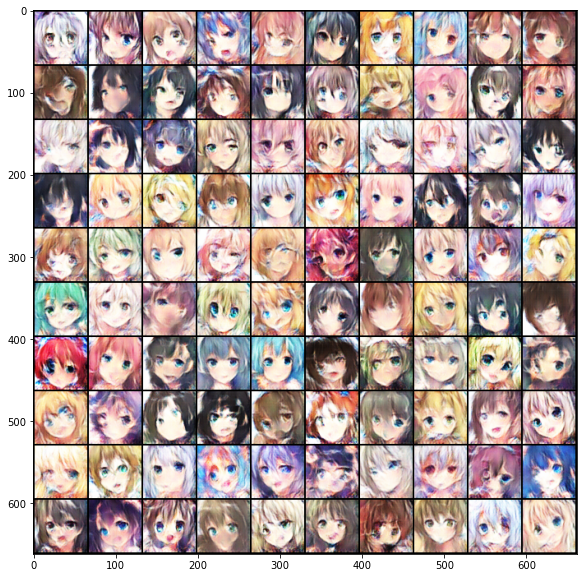

  0%|          | 0/1115 [00:00<?, ?it/s]

{'Loss_D': 0.2038, 'Loss_G': 2.2644, 'Epoch': 8, 'Step': 7806}
{'Loss_D': 0.1404, 'Loss_G': 3.5725, 'Epoch': 8, 'Step': 7807}
{'Loss_D': 0.1, 'Loss_G': 3.9873, 'Epoch': 8, 'Step': 7808}
{'Loss_D': 0.1792, 'Loss_G': 2.6747, 'Epoch': 8, 'Step': 7809}
{'Loss_D': 0.1715, 'Loss_G': 3.8412, 'Epoch': 8, 'Step': 7810}
{'Loss_D': 0.1397, 'Loss_G': 3.1607, 'Epoch': 8, 'Step': 7811}
{'Loss_D': 0.1406, 'Loss_G': 3.1767, 'Epoch': 8, 'Step': 7812}
{'Loss_D': 0.1827, 'Loss_G': 3.9547, 'Epoch': 8, 'Step': 7813}
{'Loss_D': 0.1368, 'Loss_G': 2.724, 'Epoch': 8, 'Step': 7814}
{'Loss_D': 0.1562, 'Loss_G': 3.5243, 'Epoch': 8, 'Step': 7815}
{'Loss_D': 0.1419, 'Loss_G': 3.4833, 'Epoch': 8, 'Step': 7816}
{'Loss_D': 0.1264, 'Loss_G': 3.8664, 'Epoch': 8, 'Step': 7817}
{'Loss_D': 0.1745, 'Loss_G': 3.2265, 'Epoch': 8, 'Step': 7818}
{'Loss_D': 0.1176, 'Loss_G': 3.558, 'Epoch': 8, 'Step': 7819}
{'Loss_D': 0.1501, 'Loss_G': 2.7374, 'Epoch': 8, 'Step': 7820}
{'Loss_D': 0.1381, 'Loss_G': 5.2922, 'Epoch': 8, 'Step': 782

{'Loss_D': 0.1261, 'Loss_G': 4.6376, 'Epoch': 8, 'Step': 7938}
{'Loss_D': 0.1549, 'Loss_G': 3.2906, 'Epoch': 8, 'Step': 7939}
{'Loss_D': 0.1163, 'Loss_G': 3.2012, 'Epoch': 8, 'Step': 7940}
{'Loss_D': 0.1987, 'Loss_G': 4.8775, 'Epoch': 8, 'Step': 7941}
{'Loss_D': 0.1816, 'Loss_G': 3.4037, 'Epoch': 8, 'Step': 7942}
{'Loss_D': 0.1249, 'Loss_G': 3.0576, 'Epoch': 8, 'Step': 7943}
{'Loss_D': 0.1719, 'Loss_G': 3.3337, 'Epoch': 8, 'Step': 7944}
{'Loss_D': 0.0985, 'Loss_G': 3.453, 'Epoch': 8, 'Step': 7945}
{'Loss_D': 0.1341, 'Loss_G': 2.596, 'Epoch': 8, 'Step': 7946}
{'Loss_D': 0.1539, 'Loss_G': 4.3731, 'Epoch': 8, 'Step': 7947}
{'Loss_D': 0.2541, 'Loss_G': 1.934, 'Epoch': 8, 'Step': 7948}
{'Loss_D': 0.3639, 'Loss_G': 6.3588, 'Epoch': 8, 'Step': 7949}
{'Loss_D': 0.4146, 'Loss_G': 3.0545, 'Epoch': 8, 'Step': 7950}
{'Loss_D': 0.2066, 'Loss_G': 4.4034, 'Epoch': 8, 'Step': 7951}
{'Loss_D': 0.1237, 'Loss_G': 3.9326, 'Epoch': 8, 'Step': 7952}
{'Loss_D': 0.0786, 'Loss_G': 4.0489, 'Epoch': 8, 'Step': 7

{'Loss_D': 0.2833, 'Loss_G': 4.7205, 'Epoch': 8, 'Step': 8070}
{'Loss_D': 0.2318, 'Loss_G': 2.8728, 'Epoch': 8, 'Step': 8071}
{'Loss_D': 0.1249, 'Loss_G': 2.9735, 'Epoch': 8, 'Step': 8072}
{'Loss_D': 0.1299, 'Loss_G': 4.6675, 'Epoch': 8, 'Step': 8073}
{'Loss_D': 0.2056, 'Loss_G': 2.5103, 'Epoch': 8, 'Step': 8074}
{'Loss_D': 0.1686, 'Loss_G': 3.7972, 'Epoch': 8, 'Step': 8075}
{'Loss_D': 0.1827, 'Loss_G': 2.9421, 'Epoch': 8, 'Step': 8076}
{'Loss_D': 0.1511, 'Loss_G': 3.4359, 'Epoch': 8, 'Step': 8077}
{'Loss_D': 0.1345, 'Loss_G': 3.0405, 'Epoch': 8, 'Step': 8078}
{'Loss_D': 0.1936, 'Loss_G': 3.5502, 'Epoch': 8, 'Step': 8079}
{'Loss_D': 0.1456, 'Loss_G': 2.9196, 'Epoch': 8, 'Step': 8080}
{'Loss_D': 0.1849, 'Loss_G': 4.5461, 'Epoch': 8, 'Step': 8081}
{'Loss_D': 0.1881, 'Loss_G': 2.3376, 'Epoch': 8, 'Step': 8082}
{'Loss_D': 0.2211, 'Loss_G': 3.1701, 'Epoch': 8, 'Step': 8083}
{'Loss_D': 0.0905, 'Loss_G': 4.341, 'Epoch': 8, 'Step': 8084}
{'Loss_D': 0.1586, 'Loss_G': 2.8264, 'Epoch': 8, 'Step':

{'Loss_D': 0.2602, 'Loss_G': 5.4178, 'Epoch': 8, 'Step': 8202}
{'Loss_D': 0.2184, 'Loss_G': 3.7865, 'Epoch': 8, 'Step': 8203}
{'Loss_D': 0.1451, 'Loss_G': 3.1023, 'Epoch': 8, 'Step': 8204}
{'Loss_D': 0.1659, 'Loss_G': 3.8519, 'Epoch': 8, 'Step': 8205}
{'Loss_D': 0.1337, 'Loss_G': 3.7415, 'Epoch': 8, 'Step': 8206}
{'Loss_D': 0.108, 'Loss_G': 3.6663, 'Epoch': 8, 'Step': 8207}
{'Loss_D': 0.1505, 'Loss_G': 2.9097, 'Epoch': 8, 'Step': 8208}
{'Loss_D': 0.1767, 'Loss_G': 3.7611, 'Epoch': 8, 'Step': 8209}
{'Loss_D': 0.1106, 'Loss_G': 4.032, 'Epoch': 8, 'Step': 8210}
{'Loss_D': 0.1975, 'Loss_G': 1.724, 'Epoch': 8, 'Step': 8211}
{'Loss_D': 0.3017, 'Loss_G': 5.6773, 'Epoch': 8, 'Step': 8212}
{'Loss_D': 0.3112, 'Loss_G': 2.4331, 'Epoch': 8, 'Step': 8213}
{'Loss_D': 0.174, 'Loss_G': 3.9292, 'Epoch': 8, 'Step': 8214}
{'Loss_D': 0.0957, 'Loss_G': 4.1925, 'Epoch': 8, 'Step': 8215}
{'Loss_D': 0.1224, 'Loss_G': 3.322, 'Epoch': 8, 'Step': 8216}
{'Loss_D': 0.1059, 'Loss_G': 3.1556, 'Epoch': 8, 'Step': 821

{'Loss_D': 0.1413, 'Loss_G': 3.9472, 'Epoch': 8, 'Step': 8334}
{'Loss_D': 0.1618, 'Loss_G': 2.2882, 'Epoch': 8, 'Step': 8335}
{'Loss_D': 0.2143, 'Loss_G': 5.1986, 'Epoch': 8, 'Step': 8336}
{'Loss_D': 0.2275, 'Loss_G': 2.9403, 'Epoch': 8, 'Step': 8337}
{'Loss_D': 0.1532, 'Loss_G': 3.4969, 'Epoch': 8, 'Step': 8338}
{'Loss_D': 0.1467, 'Loss_G': 5.5075, 'Epoch': 8, 'Step': 8339}
{'Loss_D': 0.1315, 'Loss_G': 3.4715, 'Epoch': 8, 'Step': 8340}
{'Loss_D': 0.1165, 'Loss_G': 3.6874, 'Epoch': 8, 'Step': 8341}
{'Loss_D': 0.1333, 'Loss_G': 3.6562, 'Epoch': 8, 'Step': 8342}
{'Loss_D': 0.1097, 'Loss_G': 4.2814, 'Epoch': 8, 'Step': 8343}
{'Loss_D': 0.2261, 'Loss_G': 2.1774, 'Epoch': 8, 'Step': 8344}
{'Loss_D': 0.1833, 'Loss_G': 4.8384, 'Epoch': 8, 'Step': 8345}
{'Loss_D': 0.1744, 'Loss_G': 3.4872, 'Epoch': 8, 'Step': 8346}
{'Loss_D': 0.142, 'Loss_G': 1.9023, 'Epoch': 8, 'Step': 8347}
{'Loss_D': 0.1986, 'Loss_G': 5.5222, 'Epoch': 8, 'Step': 8348}
{'Loss_D': 0.1432, 'Loss_G': 3.8221, 'Epoch': 8, 'Step':

{'Loss_D': 0.1862, 'Loss_G': 3.6463, 'Epoch': 8, 'Step': 8466}
{'Loss_D': 0.1315, 'Loss_G': 3.446, 'Epoch': 8, 'Step': 8467}
{'Loss_D': 0.1608, 'Loss_G': 2.7196, 'Epoch': 8, 'Step': 8468}
{'Loss_D': 0.1881, 'Loss_G': 4.267, 'Epoch': 8, 'Step': 8469}
{'Loss_D': 0.1919, 'Loss_G': 2.358, 'Epoch': 8, 'Step': 8470}
{'Loss_D': 0.2009, 'Loss_G': 3.7274, 'Epoch': 8, 'Step': 8471}
{'Loss_D': 0.2165, 'Loss_G': 1.7351, 'Epoch': 8, 'Step': 8472}
{'Loss_D': 0.2247, 'Loss_G': 4.614, 'Epoch': 8, 'Step': 8473}
{'Loss_D': 0.123, 'Loss_G': 3.7334, 'Epoch': 8, 'Step': 8474}
{'Loss_D': 0.111, 'Loss_G': 2.7667, 'Epoch': 8, 'Step': 8475}
{'Loss_D': 0.1713, 'Loss_G': 3.4849, 'Epoch': 8, 'Step': 8476}
{'Loss_D': 0.1181, 'Loss_G': 3.5759, 'Epoch': 8, 'Step': 8477}
{'Loss_D': 0.1259, 'Loss_G': 2.6947, 'Epoch': 8, 'Step': 8478}
{'Loss_D': 0.1741, 'Loss_G': 3.0199, 'Epoch': 8, 'Step': 8479}
{'Loss_D': 0.1606, 'Loss_G': 3.4839, 'Epoch': 8, 'Step': 8480}
{'Loss_D': 0.1416, 'Loss_G': 2.6847, 'Epoch': 8, 'Step': 8481

{'Loss_D': 0.1964, 'Loss_G': 3.3608, 'Epoch': 8, 'Step': 8598}
{'Loss_D': 0.1258, 'Loss_G': 3.5675, 'Epoch': 8, 'Step': 8599}
{'Loss_D': 0.103, 'Loss_G': 3.1156, 'Epoch': 8, 'Step': 8600}
{'Loss_D': 0.1339, 'Loss_G': 4.4931, 'Epoch': 8, 'Step': 8601}
{'Loss_D': 0.1209, 'Loss_G': 3.5022, 'Epoch': 8, 'Step': 8602}
{'Loss_D': 0.1105, 'Loss_G': 3.5552, 'Epoch': 8, 'Step': 8603}
{'Loss_D': 0.1852, 'Loss_G': 2.646, 'Epoch': 8, 'Step': 8604}
{'Loss_D': 0.1659, 'Loss_G': 4.1188, 'Epoch': 8, 'Step': 8605}
{'Loss_D': 0.1058, 'Loss_G': 4.1545, 'Epoch': 8, 'Step': 8606}
{'Loss_D': 0.1634, 'Loss_G': 1.8025, 'Epoch': 8, 'Step': 8607}
{'Loss_D': 0.2806, 'Loss_G': 6.2087, 'Epoch': 8, 'Step': 8608}
{'Loss_D': 0.3199, 'Loss_G': 2.1925, 'Epoch': 8, 'Step': 8609}
{'Loss_D': 0.2568, 'Loss_G': 4.3805, 'Epoch': 8, 'Step': 8610}
{'Loss_D': 0.1118, 'Loss_G': 3.935, 'Epoch': 8, 'Step': 8611}
{'Loss_D': 0.1426, 'Loss_G': 2.1145, 'Epoch': 8, 'Step': 8612}
{'Loss_D': 0.2752, 'Loss_G': 6.1326, 'Epoch': 8, 'Step': 8

{'Loss_D': 0.1143, 'Loss_G': 3.0563, 'Epoch': 8, 'Step': 8730}
{'Loss_D': 0.1136, 'Loss_G': 3.7906, 'Epoch': 8, 'Step': 8731}
{'Loss_D': 0.1172, 'Loss_G': 3.5328, 'Epoch': 8, 'Step': 8732}
{'Loss_D': 0.1961, 'Loss_G': 2.6928, 'Epoch': 8, 'Step': 8733}
{'Loss_D': 0.156, 'Loss_G': 3.3552, 'Epoch': 8, 'Step': 8734}
{'Loss_D': 0.1709, 'Loss_G': 2.839, 'Epoch': 8, 'Step': 8735}
{'Loss_D': 0.1744, 'Loss_G': 4.2567, 'Epoch': 8, 'Step': 8736}
{'Loss_D': 0.1624, 'Loss_G': 2.6403, 'Epoch': 8, 'Step': 8737}
{'Loss_D': 0.1982, 'Loss_G': 4.3662, 'Epoch': 8, 'Step': 8738}
{'Loss_D': 0.1019, 'Loss_G': 3.5503, 'Epoch': 8, 'Step': 8739}
{'Loss_D': 0.111, 'Loss_G': 3.635, 'Epoch': 8, 'Step': 8740}
{'Loss_D': 0.176, 'Loss_G': 2.1889, 'Epoch': 8, 'Step': 8741}
{'Loss_D': 0.1113, 'Loss_G': 3.3092, 'Epoch': 8, 'Step': 8742}
{'Loss_D': 0.1086, 'Loss_G': 3.3041, 'Epoch': 8, 'Step': 8743}
{'Loss_D': 0.1248, 'Loss_G': 2.5691, 'Epoch': 8, 'Step': 8744}
{'Loss_D': 0.1168, 'Loss_G': 3.2573, 'Epoch': 8, 'Step': 874

{'Loss_D': 0.3083, 'Loss_G': 4.2724, 'Epoch': 8, 'Step': 8862}
{'Loss_D': 0.3225, 'Loss_G': 2.1199, 'Epoch': 8, 'Step': 8863}
{'Loss_D': 0.2367, 'Loss_G': 4.9593, 'Epoch': 8, 'Step': 8864}
{'Loss_D': 0.1366, 'Loss_G': 3.9463, 'Epoch': 8, 'Step': 8865}
{'Loss_D': 0.0978, 'Loss_G': 3.0812, 'Epoch': 8, 'Step': 8866}
{'Loss_D': 0.1417, 'Loss_G': 4.2822, 'Epoch': 8, 'Step': 8867}
{'Loss_D': 0.1449, 'Loss_G': 2.662, 'Epoch': 8, 'Step': 8868}
{'Loss_D': 0.2502, 'Loss_G': 5.0804, 'Epoch': 8, 'Step': 8869}
{'Loss_D': 0.3011, 'Loss_G': 2.7571, 'Epoch': 8, 'Step': 8870}
{'Loss_D': 0.2778, 'Loss_G': 5.223, 'Epoch': 8, 'Step': 8871}
{'Loss_D': 0.2479, 'Loss_G': 2.7237, 'Epoch': 8, 'Step': 8872}
{'Loss_D': 0.1652, 'Loss_G': 4.1953, 'Epoch': 8, 'Step': 8873}
{'Loss_D': 0.1488, 'Loss_G': 4.0296, 'Epoch': 8, 'Step': 8874}
{'Loss_D': 0.0816, 'Loss_G': 3.8365, 'Epoch': 8, 'Step': 8875}
{'Loss_D': 0.1181, 'Loss_G': 5.2949, 'Epoch': 8, 'Step': 8876}
{'Loss_D': 0.1763, 'Loss_G': 3.5291, 'Epoch': 8, 'Step': 

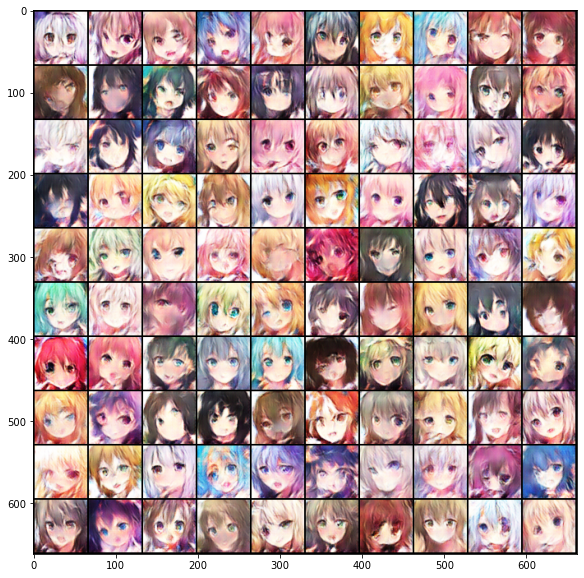

  0%|          | 0/1115 [00:00<?, ?it/s]

{'Loss_D': 0.1221, 'Loss_G': 3.9148, 'Epoch': 9, 'Step': 8921}
{'Loss_D': 0.2044, 'Loss_G': 2.3681, 'Epoch': 9, 'Step': 8922}
{'Loss_D': 0.1435, 'Loss_G': 4.0194, 'Epoch': 9, 'Step': 8923}
{'Loss_D': 0.2287, 'Loss_G': 3.295, 'Epoch': 9, 'Step': 8924}
{'Loss_D': 0.1329, 'Loss_G': 3.6743, 'Epoch': 9, 'Step': 8925}
{'Loss_D': 0.1416, 'Loss_G': 4.2452, 'Epoch': 9, 'Step': 8926}
{'Loss_D': 0.1066, 'Loss_G': 4.0707, 'Epoch': 9, 'Step': 8927}
{'Loss_D': 0.0808, 'Loss_G': 3.5635, 'Epoch': 9, 'Step': 8928}
{'Loss_D': 0.1153, 'Loss_G': 3.3392, 'Epoch': 9, 'Step': 8929}
{'Loss_D': 0.1235, 'Loss_G': 2.8657, 'Epoch': 9, 'Step': 8930}
{'Loss_D': 0.1458, 'Loss_G': 3.4233, 'Epoch': 9, 'Step': 8931}
{'Loss_D': 0.1781, 'Loss_G': 3.3653, 'Epoch': 9, 'Step': 8932}
{'Loss_D': 0.1373, 'Loss_G': 4.0666, 'Epoch': 9, 'Step': 8933}
{'Loss_D': 0.1437, 'Loss_G': 3.4176, 'Epoch': 9, 'Step': 8934}
{'Loss_D': 0.134, 'Loss_G': 2.7237, 'Epoch': 9, 'Step': 8935}
{'Loss_D': 0.1324, 'Loss_G': 4.2851, 'Epoch': 9, 'Step': 

{'Loss_D': 0.1285, 'Loss_G': 3.9588, 'Epoch': 9, 'Step': 9053}
{'Loss_D': 0.1563, 'Loss_G': 3.3921, 'Epoch': 9, 'Step': 9054}
{'Loss_D': 0.1184, 'Loss_G': 3.1011, 'Epoch': 9, 'Step': 9055}
{'Loss_D': 0.1839, 'Loss_G': 2.9259, 'Epoch': 9, 'Step': 9056}
{'Loss_D': 0.1384, 'Loss_G': 4.9894, 'Epoch': 9, 'Step': 9057}
{'Loss_D': 0.1575, 'Loss_G': 3.4921, 'Epoch': 9, 'Step': 9058}
{'Loss_D': 0.1265, 'Loss_G': 2.3408, 'Epoch': 9, 'Step': 9059}
{'Loss_D': 0.1737, 'Loss_G': 3.7449, 'Epoch': 9, 'Step': 9060}
{'Loss_D': 0.1787, 'Loss_G': 3.0895, 'Epoch': 9, 'Step': 9061}
{'Loss_D': 0.1507, 'Loss_G': 2.9423, 'Epoch': 9, 'Step': 9062}
{'Loss_D': 0.1303, 'Loss_G': 3.4648, 'Epoch': 9, 'Step': 9063}
{'Loss_D': 0.1715, 'Loss_G': 4.1168, 'Epoch': 9, 'Step': 9064}
{'Loss_D': 0.114, 'Loss_G': 2.8259, 'Epoch': 9, 'Step': 9065}
{'Loss_D': 0.1194, 'Loss_G': 3.4836, 'Epoch': 9, 'Step': 9066}
{'Loss_D': 0.1515, 'Loss_G': 2.837, 'Epoch': 9, 'Step': 9067}
{'Loss_D': 0.1352, 'Loss_G': 3.5525, 'Epoch': 9, 'Step': 

{'Loss_D': 0.1151, 'Loss_G': 3.9636, 'Epoch': 9, 'Step': 9185}
{'Loss_D': 0.0996, 'Loss_G': 3.3266, 'Epoch': 9, 'Step': 9186}
{'Loss_D': 0.118, 'Loss_G': 2.792, 'Epoch': 9, 'Step': 9187}
{'Loss_D': 0.1517, 'Loss_G': 2.902, 'Epoch': 9, 'Step': 9188}
{'Loss_D': 0.1725, 'Loss_G': 3.2259, 'Epoch': 9, 'Step': 9189}
{'Loss_D': 0.1735, 'Loss_G': 2.3106, 'Epoch': 9, 'Step': 9190}
{'Loss_D': 0.2071, 'Loss_G': 4.7417, 'Epoch': 9, 'Step': 9191}
{'Loss_D': 0.2465, 'Loss_G': 2.7435, 'Epoch': 9, 'Step': 9192}
{'Loss_D': 0.1656, 'Loss_G': 4.1672, 'Epoch': 9, 'Step': 9193}
{'Loss_D': 0.0773, 'Loss_G': 4.5075, 'Epoch': 9, 'Step': 9194}
{'Loss_D': 0.1302, 'Loss_G': 2.4894, 'Epoch': 9, 'Step': 9195}
{'Loss_D': 0.182, 'Loss_G': 4.7289, 'Epoch': 9, 'Step': 9196}
{'Loss_D': 0.1245, 'Loss_G': 3.2863, 'Epoch': 9, 'Step': 9197}
{'Loss_D': 0.1164, 'Loss_G': 2.9179, 'Epoch': 9, 'Step': 9198}
{'Loss_D': 0.1131, 'Loss_G': 4.396, 'Epoch': 9, 'Step': 9199}
{'Loss_D': 0.1508, 'Loss_G': 2.7805, 'Epoch': 9, 'Step': 920

{'Loss_D': 0.2382, 'Loss_G': 3.6244, 'Epoch': 9, 'Step': 9317}
{'Loss_D': 0.1252, 'Loss_G': 4.0832, 'Epoch': 9, 'Step': 9318}
{'Loss_D': 0.1601, 'Loss_G': 3.2169, 'Epoch': 9, 'Step': 9319}
{'Loss_D': 0.1184, 'Loss_G': 2.4587, 'Epoch': 9, 'Step': 9320}
{'Loss_D': 0.2204, 'Loss_G': 4.6048, 'Epoch': 9, 'Step': 9321}
{'Loss_D': 0.1856, 'Loss_G': 2.2295, 'Epoch': 9, 'Step': 9322}
{'Loss_D': 0.228, 'Loss_G': 4.5988, 'Epoch': 9, 'Step': 9323}
{'Loss_D': 0.1562, 'Loss_G': 3.8219, 'Epoch': 9, 'Step': 9324}
{'Loss_D': 0.2446, 'Loss_G': 2.325, 'Epoch': 9, 'Step': 9325}
{'Loss_D': 0.2279, 'Loss_G': 5.6493, 'Epoch': 9, 'Step': 9326}
{'Loss_D': 0.2222, 'Loss_G': 2.9039, 'Epoch': 9, 'Step': 9327}
{'Loss_D': 0.196, 'Loss_G': 2.8117, 'Epoch': 9, 'Step': 9328}
{'Loss_D': 0.1521, 'Loss_G': 4.49, 'Epoch': 9, 'Step': 9329}
{'Loss_D': 0.1343, 'Loss_G': 3.9601, 'Epoch': 9, 'Step': 9330}
{'Loss_D': 0.1529, 'Loss_G': 2.4587, 'Epoch': 9, 'Step': 9331}
{'Loss_D': 0.2066, 'Loss_G': 4.6888, 'Epoch': 9, 'Step': 933

{'Loss_D': 0.1494, 'Loss_G': 3.2071, 'Epoch': 9, 'Step': 9449}
{'Loss_D': 0.1644, 'Loss_G': 3.1282, 'Epoch': 9, 'Step': 9450}
{'Loss_D': 0.1608, 'Loss_G': 3.3849, 'Epoch': 9, 'Step': 9451}
{'Loss_D': 0.1465, 'Loss_G': 2.8039, 'Epoch': 9, 'Step': 9452}
{'Loss_D': 0.1422, 'Loss_G': 3.2757, 'Epoch': 9, 'Step': 9453}
{'Loss_D': 0.0786, 'Loss_G': 3.4296, 'Epoch': 9, 'Step': 9454}
{'Loss_D': 0.1468, 'Loss_G': 2.2916, 'Epoch': 9, 'Step': 9455}
{'Loss_D': 0.2329, 'Loss_G': 4.4827, 'Epoch': 9, 'Step': 9456}
{'Loss_D': 0.1928, 'Loss_G': 2.8026, 'Epoch': 9, 'Step': 9457}
{'Loss_D': 0.1825, 'Loss_G': 1.8537, 'Epoch': 9, 'Step': 9458}
{'Loss_D': 0.2049, 'Loss_G': 5.6136, 'Epoch': 9, 'Step': 9459}
{'Loss_D': 0.1994, 'Loss_G': 3.0495, 'Epoch': 9, 'Step': 9460}
{'Loss_D': 0.1873, 'Loss_G': 2.35, 'Epoch': 9, 'Step': 9461}
{'Loss_D': 0.1614, 'Loss_G': 4.8086, 'Epoch': 9, 'Step': 9462}
{'Loss_D': 0.1319, 'Loss_G': 4.5353, 'Epoch': 9, 'Step': 9463}
{'Loss_D': 0.1244, 'Loss_G': 2.5135, 'Epoch': 9, 'Step': 

{'Loss_D': 0.2775, 'Loss_G': 2.9643, 'Epoch': 9, 'Step': 9581}
{'Loss_D': 0.1953, 'Loss_G': 3.8815, 'Epoch': 9, 'Step': 9582}
{'Loss_D': 0.1842, 'Loss_G': 3.0258, 'Epoch': 9, 'Step': 9583}
{'Loss_D': 0.2468, 'Loss_G': 2.0632, 'Epoch': 9, 'Step': 9584}
{'Loss_D': 0.4169, 'Loss_G': 6.8999, 'Epoch': 9, 'Step': 9585}
{'Loss_D': 0.7669, 'Loss_G': 1.1038, 'Epoch': 9, 'Step': 9586}
{'Loss_D': 0.449, 'Loss_G': 4.6292, 'Epoch': 9, 'Step': 9587}
{'Loss_D': 0.1163, 'Loss_G': 5.0388, 'Epoch': 9, 'Step': 9588}
{'Loss_D': 0.2902, 'Loss_G': 2.0245, 'Epoch': 9, 'Step': 9589}
{'Loss_D': 0.3951, 'Loss_G': 5.1107, 'Epoch': 9, 'Step': 9590}
{'Loss_D': 0.229, 'Loss_G': 3.7864, 'Epoch': 9, 'Step': 9591}
{'Loss_D': 0.2088, 'Loss_G': 2.8982, 'Epoch': 9, 'Step': 9592}
{'Loss_D': 0.4046, 'Loss_G': 6.139, 'Epoch': 9, 'Step': 9593}
{'Loss_D': 0.2585, 'Loss_G': 2.843, 'Epoch': 9, 'Step': 9594}
{'Loss_D': 0.2364, 'Loss_G': 3.228, 'Epoch': 9, 'Step': 9595}
{'Loss_D': 0.2072, 'Loss_G': 4.5676, 'Epoch': 9, 'Step': 959

{'Loss_D': 0.1085, 'Loss_G': 3.4197, 'Epoch': 9, 'Step': 9713}
{'Loss_D': 0.1862, 'Loss_G': 2.5042, 'Epoch': 9, 'Step': 9714}
{'Loss_D': 0.157, 'Loss_G': 4.1085, 'Epoch': 9, 'Step': 9715}
{'Loss_D': 0.1848, 'Loss_G': 2.7595, 'Epoch': 9, 'Step': 9716}
{'Loss_D': 0.1328, 'Loss_G': 3.3359, 'Epoch': 9, 'Step': 9717}
{'Loss_D': 0.155, 'Loss_G': 3.1515, 'Epoch': 9, 'Step': 9718}
{'Loss_D': 0.0803, 'Loss_G': 2.7776, 'Epoch': 9, 'Step': 9719}
{'Loss_D': 0.1973, 'Loss_G': 4.3318, 'Epoch': 9, 'Step': 9720}
{'Loss_D': 0.1321, 'Loss_G': 3.2138, 'Epoch': 9, 'Step': 9721}
{'Loss_D': 0.1245, 'Loss_G': 3.0755, 'Epoch': 9, 'Step': 9722}
{'Loss_D': 0.1, 'Loss_G': 4.5933, 'Epoch': 9, 'Step': 9723}
{'Loss_D': 0.103, 'Loss_G': 3.0162, 'Epoch': 9, 'Step': 9724}
{'Loss_D': 0.1331, 'Loss_G': 2.8864, 'Epoch': 9, 'Step': 9725}
{'Loss_D': 0.083, 'Loss_G': 4.0547, 'Epoch': 9, 'Step': 9726}
{'Loss_D': 0.0991, 'Loss_G': 4.4272, 'Epoch': 9, 'Step': 9727}
{'Loss_D': 0.1957, 'Loss_G': 1.422, 'Epoch': 9, 'Step': 9728}


{'Loss_D': 0.1669, 'Loss_G': 4.573, 'Epoch': 9, 'Step': 9845}
{'Loss_D': 0.1086, 'Loss_G': 4.0607, 'Epoch': 9, 'Step': 9846}
{'Loss_D': 0.1764, 'Loss_G': 2.786, 'Epoch': 9, 'Step': 9847}
{'Loss_D': 0.18, 'Loss_G': 4.5233, 'Epoch': 9, 'Step': 9848}
{'Loss_D': 0.1153, 'Loss_G': 3.8316, 'Epoch': 9, 'Step': 9849}
{'Loss_D': 0.1492, 'Loss_G': 3.1161, 'Epoch': 9, 'Step': 9850}
{'Loss_D': 0.129, 'Loss_G': 4.8647, 'Epoch': 9, 'Step': 9851}
{'Loss_D': 0.17, 'Loss_G': 2.4277, 'Epoch': 9, 'Step': 9852}
{'Loss_D': 0.1506, 'Loss_G': 4.0435, 'Epoch': 9, 'Step': 9853}
{'Loss_D': 0.1551, 'Loss_G': 4.043, 'Epoch': 9, 'Step': 9854}
{'Loss_D': 0.1445, 'Loss_G': 2.6484, 'Epoch': 9, 'Step': 9855}
{'Loss_D': 0.1719, 'Loss_G': 5.1142, 'Epoch': 9, 'Step': 9856}
{'Loss_D': 0.1475, 'Loss_G': 4.0737, 'Epoch': 9, 'Step': 9857}
{'Loss_D': 0.1343, 'Loss_G': 1.7945, 'Epoch': 9, 'Step': 9858}
{'Loss_D': 0.2689, 'Loss_G': 6.4969, 'Epoch': 9, 'Step': 9859}
{'Loss_D': 0.2659, 'Loss_G': 3.7031, 'Epoch': 9, 'Step': 9860}


{'Loss_D': 0.0856, 'Loss_G': 2.7831, 'Epoch': 9, 'Step': 9977}
{'Loss_D': 0.1787, 'Loss_G': 4.8236, 'Epoch': 9, 'Step': 9978}
{'Loss_D': 0.1723, 'Loss_G': 2.4717, 'Epoch': 9, 'Step': 9979}
{'Loss_D': 0.1374, 'Loss_G': 3.0817, 'Epoch': 9, 'Step': 9980}
{'Loss_D': 0.1438, 'Loss_G': 3.5391, 'Epoch': 9, 'Step': 9981}
{'Loss_D': 0.1142, 'Loss_G': 3.3164, 'Epoch': 9, 'Step': 9982}
{'Loss_D': 0.1156, 'Loss_G': 2.9696, 'Epoch': 9, 'Step': 9983}
{'Loss_D': 0.122, 'Loss_G': 3.9264, 'Epoch': 9, 'Step': 9984}
{'Loss_D': 0.1523, 'Loss_G': 3.7418, 'Epoch': 9, 'Step': 9985}
{'Loss_D': 0.1484, 'Loss_G': 2.1501, 'Epoch': 9, 'Step': 9986}
{'Loss_D': 0.2391, 'Loss_G': 5.3529, 'Epoch': 9, 'Step': 9987}
{'Loss_D': 0.2136, 'Loss_G': 3.7213, 'Epoch': 9, 'Step': 9988}
{'Loss_D': 0.106, 'Loss_G': 2.461, 'Epoch': 9, 'Step': 9989}
{'Loss_D': 0.2063, 'Loss_G': 4.1798, 'Epoch': 9, 'Step': 9990}
{'Loss_D': 0.1204, 'Loss_G': 4.0816, 'Epoch': 9, 'Step': 9991}
{'Loss_D': 0.1242, 'Loss_G': 2.8739, 'Epoch': 9, 'Step': 9

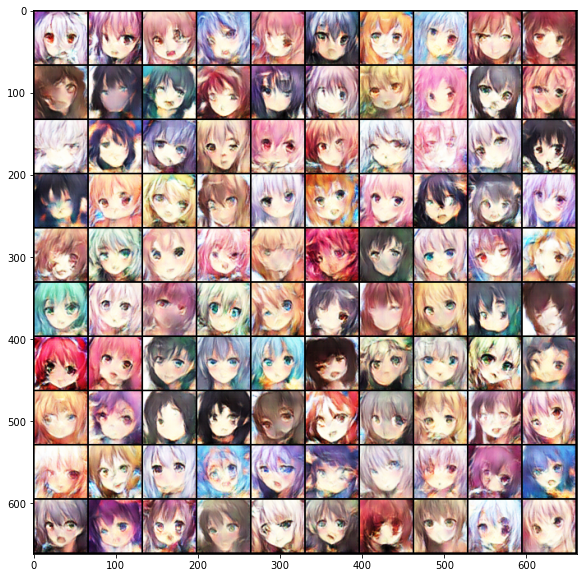

  0%|          | 0/1115 [00:00<?, ?it/s]

{'Loss_D': 0.2553, 'Loss_G': 1.9165, 'Epoch': 10, 'Step': 10036}
{'Loss_D': 0.3625, 'Loss_G': 6.5743, 'Epoch': 10, 'Step': 10037}
{'Loss_D': 0.6244, 'Loss_G': 1.1477, 'Epoch': 10, 'Step': 10038}
{'Loss_D': 0.5293, 'Loss_G': 6.3417, 'Epoch': 10, 'Step': 10039}
{'Loss_D': 0.2246, 'Loss_G': 3.8878, 'Epoch': 10, 'Step': 10040}
{'Loss_D': 0.0628, 'Loss_G': 2.8251, 'Epoch': 10, 'Step': 10041}
{'Loss_D': 0.2256, 'Loss_G': 5.1897, 'Epoch': 10, 'Step': 10042}
{'Loss_D': 0.1507, 'Loss_G': 2.8252, 'Epoch': 10, 'Step': 10043}
{'Loss_D': 0.1453, 'Loss_G': 3.7426, 'Epoch': 10, 'Step': 10044}
{'Loss_D': 0.1585, 'Loss_G': 2.4534, 'Epoch': 10, 'Step': 10045}
{'Loss_D': 0.113, 'Loss_G': 3.8924, 'Epoch': 10, 'Step': 10046}
{'Loss_D': 0.0809, 'Loss_G': 3.7642, 'Epoch': 10, 'Step': 10047}
{'Loss_D': 0.0966, 'Loss_G': 4.0293, 'Epoch': 10, 'Step': 10048}
{'Loss_D': 0.1075, 'Loss_G': 2.9791, 'Epoch': 10, 'Step': 10049}
{'Loss_D': 0.1419, 'Loss_G': 4.1844, 'Epoch': 10, 'Step': 10050}
{'Loss_D': 0.126, 'Loss_G'

{'Loss_D': 0.0962, 'Loss_G': 3.7902, 'Epoch': 10, 'Step': 10164}
{'Loss_D': 0.1646, 'Loss_G': 2.6985, 'Epoch': 10, 'Step': 10165}
{'Loss_D': 0.1703, 'Loss_G': 3.0079, 'Epoch': 10, 'Step': 10166}
{'Loss_D': 0.1075, 'Loss_G': 3.6914, 'Epoch': 10, 'Step': 10167}
{'Loss_D': 0.1675, 'Loss_G': 2.6234, 'Epoch': 10, 'Step': 10168}
{'Loss_D': 0.1213, 'Loss_G': 3.6076, 'Epoch': 10, 'Step': 10169}
{'Loss_D': 0.0975, 'Loss_G': 4.0059, 'Epoch': 10, 'Step': 10170}
{'Loss_D': 0.1007, 'Loss_G': 3.3538, 'Epoch': 10, 'Step': 10171}
{'Loss_D': 0.1195, 'Loss_G': 2.8949, 'Epoch': 10, 'Step': 10172}
{'Loss_D': 0.1607, 'Loss_G': 3.9079, 'Epoch': 10, 'Step': 10173}
{'Loss_D': 0.1451, 'Loss_G': 2.8768, 'Epoch': 10, 'Step': 10174}
{'Loss_D': 0.1682, 'Loss_G': 3.9469, 'Epoch': 10, 'Step': 10175}
{'Loss_D': 0.1271, 'Loss_G': 4.0496, 'Epoch': 10, 'Step': 10176}
{'Loss_D': 0.1421, 'Loss_G': 2.8895, 'Epoch': 10, 'Step': 10177}
{'Loss_D': 0.1198, 'Loss_G': 3.3291, 'Epoch': 10, 'Step': 10178}
{'Loss_D': 0.0947, 'Loss_

{'Loss_D': 0.1193, 'Loss_G': 3.0346, 'Epoch': 10, 'Step': 10292}
{'Loss_D': 0.1426, 'Loss_G': 3.7939, 'Epoch': 10, 'Step': 10293}
{'Loss_D': 0.1181, 'Loss_G': 3.5136, 'Epoch': 10, 'Step': 10294}
{'Loss_D': 0.1041, 'Loss_G': 3.4475, 'Epoch': 10, 'Step': 10295}
{'Loss_D': 0.1061, 'Loss_G': 4.2869, 'Epoch': 10, 'Step': 10296}
{'Loss_D': 0.0975, 'Loss_G': 3.4029, 'Epoch': 10, 'Step': 10297}
{'Loss_D': 0.1554, 'Loss_G': 2.5227, 'Epoch': 10, 'Step': 10298}
{'Loss_D': 0.1736, 'Loss_G': 4.6079, 'Epoch': 10, 'Step': 10299}
{'Loss_D': 0.1637, 'Loss_G': 2.5949, 'Epoch': 10, 'Step': 10300}
{'Loss_D': 0.1542, 'Loss_G': 3.8497, 'Epoch': 10, 'Step': 10301}
{'Loss_D': 0.074, 'Loss_G': 3.6766, 'Epoch': 10, 'Step': 10302}
{'Loss_D': 0.1482, 'Loss_G': 2.7731, 'Epoch': 10, 'Step': 10303}
{'Loss_D': 0.1644, 'Loss_G': 4.3149, 'Epoch': 10, 'Step': 10304}
{'Loss_D': 0.0576, 'Loss_G': 4.7323, 'Epoch': 10, 'Step': 10305}
{'Loss_D': 0.2053, 'Loss_G': 0.9163, 'Epoch': 10, 'Step': 10306}
{'Loss_D': 0.4411, 'Loss_G

{'Loss_D': 0.1089, 'Loss_G': 6.1463, 'Epoch': 10, 'Step': 10420}
{'Loss_D': 0.2263, 'Loss_G': 1.7656, 'Epoch': 10, 'Step': 10421}
{'Loss_D': 0.3359, 'Loss_G': 6.8439, 'Epoch': 10, 'Step': 10422}
{'Loss_D': 0.3502, 'Loss_G': 2.8971, 'Epoch': 10, 'Step': 10423}
{'Loss_D': 0.2315, 'Loss_G': 4.7241, 'Epoch': 10, 'Step': 10424}
{'Loss_D': 0.0583, 'Loss_G': 5.8529, 'Epoch': 10, 'Step': 10425}
{'Loss_D': 0.2112, 'Loss_G': 2.039, 'Epoch': 10, 'Step': 10426}
{'Loss_D': 0.2565, 'Loss_G': 4.9306, 'Epoch': 10, 'Step': 10427}
{'Loss_D': 0.1125, 'Loss_G': 4.7693, 'Epoch': 10, 'Step': 10428}
{'Loss_D': 0.1124, 'Loss_G': 3.4894, 'Epoch': 10, 'Step': 10429}
{'Loss_D': 0.0948, 'Loss_G': 2.8642, 'Epoch': 10, 'Step': 10430}
{'Loss_D': 0.1406, 'Loss_G': 4.5127, 'Epoch': 10, 'Step': 10431}
{'Loss_D': 0.3066, 'Loss_G': 1.3469, 'Epoch': 10, 'Step': 10432}
{'Loss_D': 0.4934, 'Loss_G': 6.9526, 'Epoch': 10, 'Step': 10433}
{'Loss_D': 0.3209, 'Loss_G': 4.6267, 'Epoch': 10, 'Step': 10434}
{'Loss_D': 0.1384, 'Loss_G

{'Loss_D': 0.7802, 'Loss_G': 2.3192, 'Epoch': 10, 'Step': 10548}
{'Loss_D': 0.294, 'Loss_G': 3.5144, 'Epoch': 10, 'Step': 10549}
{'Loss_D': 0.2202, 'Loss_G': 4.2207, 'Epoch': 10, 'Step': 10550}
{'Loss_D': 0.3132, 'Loss_G': 1.3649, 'Epoch': 10, 'Step': 10551}
{'Loss_D': 0.7025, 'Loss_G': 7.8463, 'Epoch': 10, 'Step': 10552}
{'Loss_D': 0.9246, 'Loss_G': 1.5508, 'Epoch': 10, 'Step': 10553}
{'Loss_D': 0.5187, 'Loss_G': 4.7875, 'Epoch': 10, 'Step': 10554}
{'Loss_D': 0.1832, 'Loss_G': 4.059, 'Epoch': 10, 'Step': 10555}
{'Loss_D': 0.1728, 'Loss_G': 2.8668, 'Epoch': 10, 'Step': 10556}
{'Loss_D': 0.2189, 'Loss_G': 3.6688, 'Epoch': 10, 'Step': 10557}
{'Loss_D': 0.3882, 'Loss_G': 1.9143, 'Epoch': 10, 'Step': 10558}
{'Loss_D': 0.3384, 'Loss_G': 4.6541, 'Epoch': 10, 'Step': 10559}
{'Loss_D': 0.464, 'Loss_G': 1.8239, 'Epoch': 10, 'Step': 10560}
{'Loss_D': 0.4139, 'Loss_G': 5.5949, 'Epoch': 10, 'Step': 10561}
{'Loss_D': 0.1916, 'Loss_G': 5.0194, 'Epoch': 10, 'Step': 10562}
{'Loss_D': 0.1219, 'Loss_G':

{'Loss_D': 0.1616, 'Loss_G': 4.2846, 'Epoch': 10, 'Step': 10676}
{'Loss_D': 0.1592, 'Loss_G': 2.2239, 'Epoch': 10, 'Step': 10677}
{'Loss_D': 0.1712, 'Loss_G': 4.5723, 'Epoch': 10, 'Step': 10678}
{'Loss_D': 0.1778, 'Loss_G': 2.9752, 'Epoch': 10, 'Step': 10679}
{'Loss_D': 0.1082, 'Loss_G': 2.6221, 'Epoch': 10, 'Step': 10680}
{'Loss_D': 0.1038, 'Loss_G': 3.0061, 'Epoch': 10, 'Step': 10681}
{'Loss_D': 0.1132, 'Loss_G': 3.8596, 'Epoch': 10, 'Step': 10682}
{'Loss_D': 0.0705, 'Loss_G': 3.7036, 'Epoch': 10, 'Step': 10683}
{'Loss_D': 0.0736, 'Loss_G': 4.0937, 'Epoch': 10, 'Step': 10684}
{'Loss_D': 0.1625, 'Loss_G': 1.7239, 'Epoch': 10, 'Step': 10685}
{'Loss_D': 0.181, 'Loss_G': 3.7803, 'Epoch': 10, 'Step': 10686}
{'Loss_D': 0.109, 'Loss_G': 3.6938, 'Epoch': 10, 'Step': 10687}
{'Loss_D': 0.1091, 'Loss_G': 3.2112, 'Epoch': 10, 'Step': 10688}
{'Loss_D': 0.1354, 'Loss_G': 3.0597, 'Epoch': 10, 'Step': 10689}
{'Loss_D': 0.113, 'Loss_G': 3.4132, 'Epoch': 10, 'Step': 10690}
{'Loss_D': 0.1477, 'Loss_G':

{'Loss_D': 0.2281, 'Loss_G': 5.7482, 'Epoch': 10, 'Step': 10804}
{'Loss_D': 0.15, 'Loss_G': 4.8791, 'Epoch': 10, 'Step': 10805}
{'Loss_D': 0.1386, 'Loss_G': 2.0494, 'Epoch': 10, 'Step': 10806}
{'Loss_D': 0.2635, 'Loss_G': 6.256, 'Epoch': 10, 'Step': 10807}
{'Loss_D': 0.1613, 'Loss_G': 4.0778, 'Epoch': 10, 'Step': 10808}
{'Loss_D': 0.1263, 'Loss_G': 2.3369, 'Epoch': 10, 'Step': 10809}
{'Loss_D': 0.226, 'Loss_G': 5.3306, 'Epoch': 10, 'Step': 10810}
{'Loss_D': 0.4895, 'Loss_G': 1.0296, 'Epoch': 10, 'Step': 10811}
{'Loss_D': 0.6237, 'Loss_G': 7.5531, 'Epoch': 10, 'Step': 10812}
{'Loss_D': 0.6421, 'Loss_G': 1.5808, 'Epoch': 10, 'Step': 10813}
{'Loss_D': 0.3984, 'Loss_G': 6.6777, 'Epoch': 10, 'Step': 10814}
{'Loss_D': 0.1133, 'Loss_G': 4.6951, 'Epoch': 10, 'Step': 10815}
{'Loss_D': 0.0928, 'Loss_G': 2.7458, 'Epoch': 10, 'Step': 10816}
{'Loss_D': 0.2522, 'Loss_G': 5.4281, 'Epoch': 10, 'Step': 10817}
{'Loss_D': 0.3594, 'Loss_G': 1.4384, 'Epoch': 10, 'Step': 10818}
{'Loss_D': 0.4249, 'Loss_G': 

{'Loss_D': 0.0905, 'Loss_G': 4.1262, 'Epoch': 10, 'Step': 10932}
{'Loss_D': 0.1673, 'Loss_G': 2.3419, 'Epoch': 10, 'Step': 10933}
{'Loss_D': 0.1426, 'Loss_G': 4.0106, 'Epoch': 10, 'Step': 10934}
{'Loss_D': 0.0674, 'Loss_G': 4.5702, 'Epoch': 10, 'Step': 10935}
{'Loss_D': 0.1081, 'Loss_G': 2.9054, 'Epoch': 10, 'Step': 10936}
{'Loss_D': 0.2084, 'Loss_G': 3.4123, 'Epoch': 10, 'Step': 10937}
{'Loss_D': 0.1278, 'Loss_G': 3.7359, 'Epoch': 10, 'Step': 10938}
{'Loss_D': 0.1133, 'Loss_G': 3.2143, 'Epoch': 10, 'Step': 10939}
{'Loss_D': 0.1146, 'Loss_G': 4.0599, 'Epoch': 10, 'Step': 10940}
{'Loss_D': 0.2122, 'Loss_G': 1.452, 'Epoch': 10, 'Step': 10941}
{'Loss_D': 0.3372, 'Loss_G': 7.1667, 'Epoch': 10, 'Step': 10942}
{'Loss_D': 0.4365, 'Loss_G': 2.0273, 'Epoch': 10, 'Step': 10943}
{'Loss_D': 0.2174, 'Loss_G': 5.0756, 'Epoch': 10, 'Step': 10944}
{'Loss_D': 0.0721, 'Loss_G': 4.5085, 'Epoch': 10, 'Step': 10945}
{'Loss_D': 0.1147, 'Loss_G': 2.2278, 'Epoch': 10, 'Step': 10946}
{'Loss_D': 0.1471, 'Loss_G

{'Loss_D': 0.1291, 'Loss_G': 2.6748, 'Epoch': 10, 'Step': 11060}
{'Loss_D': 0.1553, 'Loss_G': 5.0799, 'Epoch': 10, 'Step': 11061}
{'Loss_D': 0.1712, 'Loss_G': 2.9016, 'Epoch': 10, 'Step': 11062}
{'Loss_D': 0.1187, 'Loss_G': 4.1128, 'Epoch': 10, 'Step': 11063}
{'Loss_D': 0.0897, 'Loss_G': 4.1047, 'Epoch': 10, 'Step': 11064}
{'Loss_D': 0.1038, 'Loss_G': 2.458, 'Epoch': 10, 'Step': 11065}
{'Loss_D': 0.1383, 'Loss_G': 4.6998, 'Epoch': 10, 'Step': 11066}
{'Loss_D': 0.1465, 'Loss_G': 3.4783, 'Epoch': 10, 'Step': 11067}
{'Loss_D': 0.1241, 'Loss_G': 2.6768, 'Epoch': 10, 'Step': 11068}
{'Loss_D': 0.1164, 'Loss_G': 4.6151, 'Epoch': 10, 'Step': 11069}
{'Loss_D': 0.1991, 'Loss_G': 1.6882, 'Epoch': 10, 'Step': 11070}
{'Loss_D': 0.2108, 'Loss_G': 4.8697, 'Epoch': 10, 'Step': 11071}
{'Loss_D': 0.1328, 'Loss_G': 3.6542, 'Epoch': 10, 'Step': 11072}
{'Loss_D': 0.0543, 'Loss_G': 2.4818, 'Epoch': 10, 'Step': 11073}
{'Loss_D': 0.2409, 'Loss_G': 6.8871, 'Epoch': 10, 'Step': 11074}
{'Loss_D': 0.3801, 'Loss_G

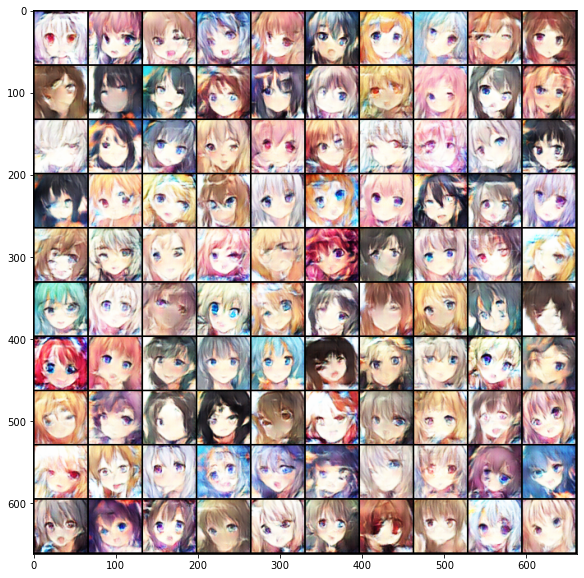

In [15]:
G_losses = []
D_losses = []
steps = 0
for e, epoch in enumerate(range(n_epoch)):
    progress_bar = tqdm(dataloader)
    for i, data in enumerate(progress_bar):
        imgs = data
        imgs = imgs.cuda()

        bs = imgs.size(0)

        # ============================================
        #  Train D
        # ============================================
        z = Variable(torch.randn(bs, z_dim)).cuda()
        r_imgs = Variable(imgs).cuda()
        f_imgs = G(z)

        """ Medium: Use WGAN Loss. """
        # Label
        r_label = torch.ones((bs)).cuda()
        f_label = torch.zeros((bs)).cuda()

        # Model forwarding
        r_logit = D(r_imgs.detach())
        f_logit = D(f_imgs.detach())
        
        # Compute the loss for the discriminator.
        r_loss = criterion(r_logit, r_label)
        f_loss = criterion(f_logit, f_label)
        loss_D = (r_loss + f_loss) / 2
        
        # WGAN Loss
        # loss_D = -torch.mean(D(r_imgs)) + torch.mean(D(f_imgs))
       

        # Model backwarding
        D.zero_grad()
        loss_D.backward()

        # Update the discriminator.
        opt_D.step()

        """ Medium: Clip weights of discriminator. """
        # for p in D.parameters():
        #    p.data.clamp_(-clip_value, clip_value)

        # ============================================
        #  Train G
        # ============================================
        if steps % n_critic == 0:
            # Generate some fake images.
            z = Variable(torch.randn(bs, z_dim)).cuda()
            f_imgs = G(z)

            # Model forwarding
            f_logit = D(f_imgs)
            
            """ Medium: Use WGAN Loss"""
            # Compute the loss for the generator.
            loss_G = criterion(f_logit, r_label)
            # WGAN Loss
            # loss_G = -torch.mean(D(f_imgs))

            # Model backwarding
            G.zero_grad()
            loss_G.backward()

            # Update the generator.
            opt_G.step()
        
        steps += 1
        
        # Set the info of the progress bar
        #   Note that the value of the GAN loss is not directly related to
        #   the quality of the generated images.
        print({
            'Loss_D': round(loss_D.item(), 4),
            'Loss_G': round(loss_G.item(), 4),
            'Epoch': e+1,
            'Step': steps,
        })
    D_losses.append(loss_D.item())
    G_losses.append(loss_G.item())
    fretchet_dist=calculate_fretchet(r_imgs,f_imgs,model) 
    print({
    'Fretchet_Distance': round(fretchet_dist, 4),
        })
    G.eval()
    f_imgs_sample = (G(z_sample).data + 1) / 2.0
    filename = os.path.join(log_dir, f'Epoch_{epoch+1:03d}.jpg')
    torchvision.utils.save_image(f_imgs_sample, filename, nrow=10)
    print(f' | Save some samples to {filename}.')
    
    # Show generated images in the jupyter notebook.
    grid_img = torchvision.utils.make_grid(f_imgs_sample.cpu(), nrow=10)
    plt.figure(figsize=(10,10))
    plt.imshow(grid_img.permute(1, 2, 0))
    plt.show()
    G.train()

    if (e+1) % 5 == 0 or e == 0:
        # Save the checkpoints.
        torch.save(G.state_dict(), os.path.join(ckpt_dir, 'G.pth'))
        torch.save(D.state_dict(), os.path.join(ckpt_dir, 'D.pth'))

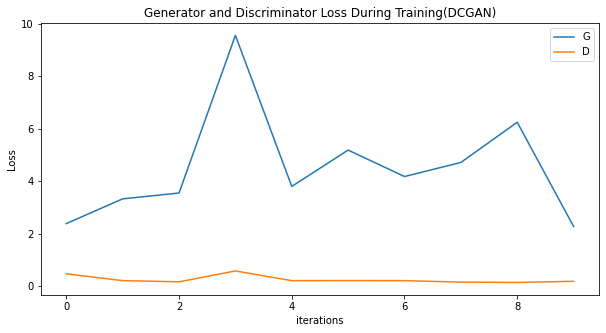

In [19]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training(DCGAN)")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

## Inference
Use the trained model to generate anime faces!

### Load model 

In [17]:
import torch

G = Generator(z_dim)
G.load_state_dict(torch.load(os.path.join(ckpt_dir, 'G.pth')))
G.eval()
G.cuda()

Generator(
  (l1): Sequential(
    (0): Linear(in_features=100, out_features=8192, bias=False)
    (1): BatchNorm1d(8192, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
  )
  (l2_5): Sequential(
    (0): Sequential(
      (0): ConvTranspose2d(512, 256, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), output_padding=(1, 1), bias=False)
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
    )
    (1): Sequential(
      (0): ConvTranspose2d(256, 128, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), output_padding=(1, 1), bias=False)
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
    )
    (2): Sequential(
      (0): ConvTranspose2d(128, 64, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), output_padding=(1, 1), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()


### Generate and show some images.


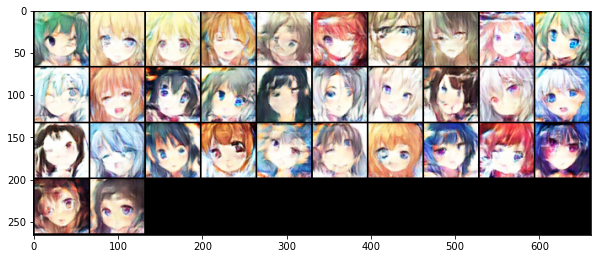

In [20]:
# Generate 1000 images and make a grid to save them.
n_output = 50
z_sample = Variable(torch.randn(n_output, z_dim)).cuda()
imgs_sample = (G(z_sample).data + 1) / 2.0
log_dir = os.path.join(path, 'logs')
filename = os.path.join(log_dir, 'result.jpg')
torchvision.utils.save_image(imgs_sample, filename, nrow=10)

# Show 32 of the images.
grid_img = torchvision.utils.make_grid(imgs_sample[:32].cpu(), nrow=10)
plt.figure(figsize=(10,10))
plt.imshow(grid_img.permute(1, 2, 0))
plt.show()

### Compress the generated images using **tar**.


In [22]:
# Save the generated images.
os.makedirs('output_DCGAN', exist_ok=True)
for i in range(50):
    torchvision.utils.save_image(imgs_sample[i], f'output_DCGAN/{i+1}.jpg')